In [101]:
#libraries we need
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import date
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


In [102]:
df = pd.read_csv('final_data.csv')

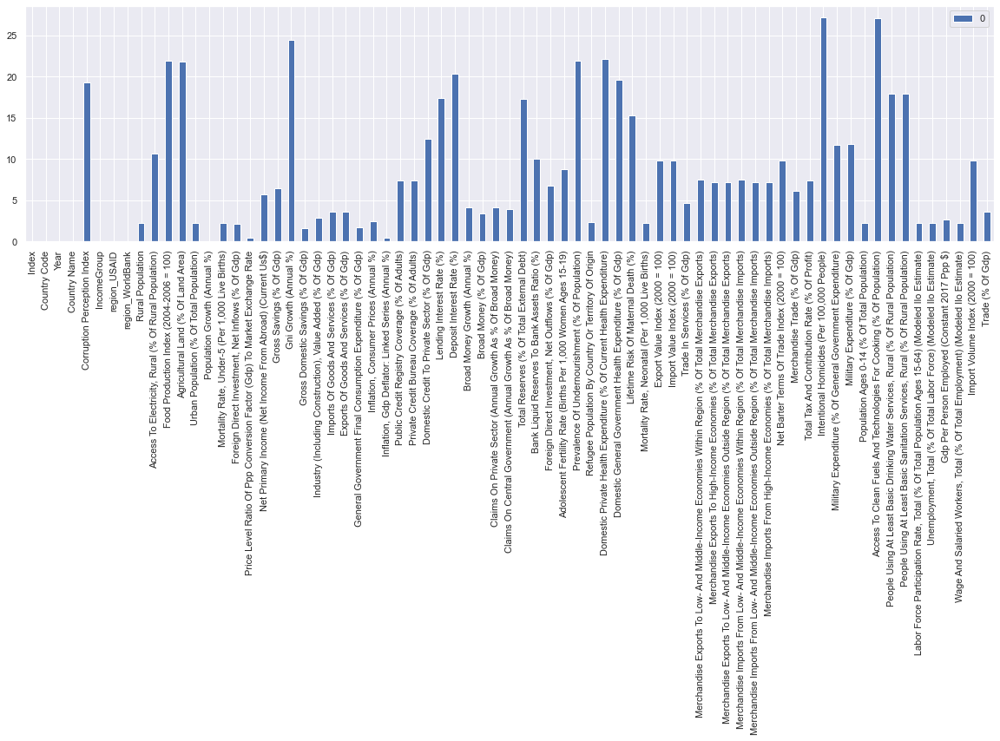

In [103]:
pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

In [104]:
df.columns

Index(['Index', 'Country Code', 'Year', 'Country Name',
       'Corruption Perception Index', 'IncomeGroup', 'region_USAID',
       'region_WorldBank', 'Rural Population',
       'Access To Electricity, Rural (% Of Rural Population)',
       'Food Production Index (2004-2006 = 100)',
       'Agricultural Land (% Of Land Area)',
       'Urban Population (% Of Total Population)',
       'Population Growth (Annual %)',
       'Mortality Rate, Under-5 (Per 1,000 Live Births)',
       'Foreign Direct Investment, Net Inflows (% Of Gdp)',
       'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
       'Net Primary Income (Net Income From Abroad) (Current Us$)',
       'Gross Savings (% Of Gdp)', 'Gni Growth (Annual %)',
       'Gross Domestic Savings (% Of Gdp)',
       'Industry (Including Construction), Value Added (% Of Gdp)',
       'Imports Of Goods And Services (% Of Gdp)',
       'Exports Of Goods And Services (% Of Gdp)',
       'General Government Final Cons

In [105]:
#pd.DataFrame(df.isnull().sum()).to_csv('check.csv')

## Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate

In [106]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate'], axis = 1)

0.9987171988215556


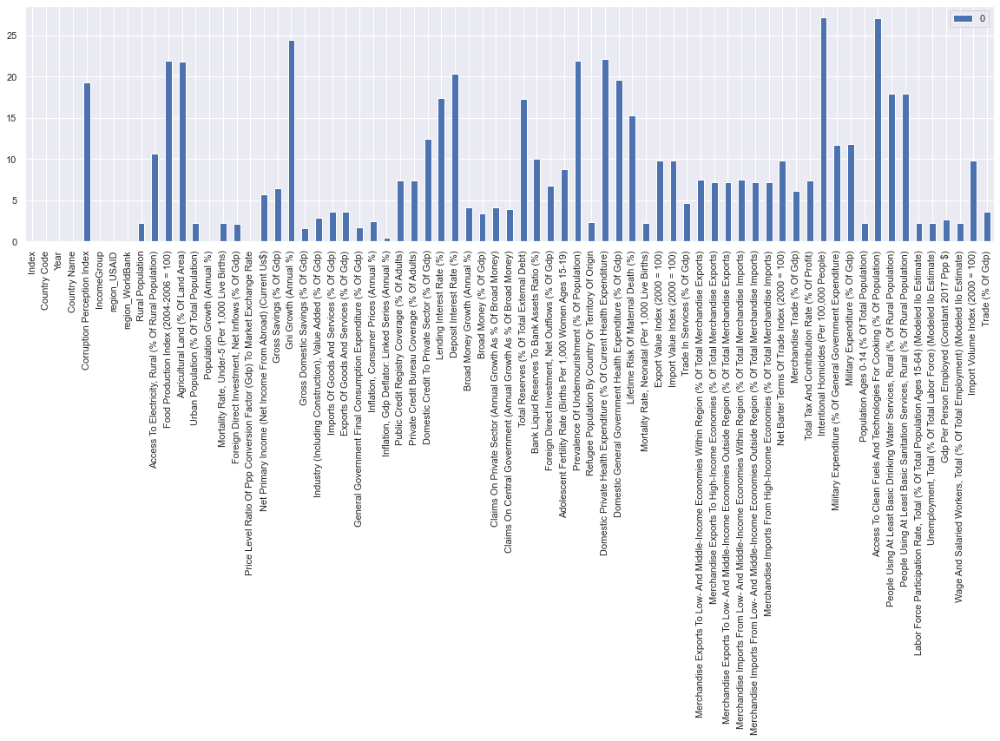

In [107]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate'].isnull(), 'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Inflation, Gdp Deflator: Linked Series (Annual %)

In [108]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)','Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Inflation, Gdp Deflator: Linked Series (Annual %)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Inflation, Gdp Deflator: Linked Series (Annual %)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Inflation, Gdp Deflator: Linked Series (Annual %)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Inflation, Gdp Deflator: Linked Series (Annual %)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Inflation, Gdp Deflator: Linked Series (Annual %)'], axis = 1)

0.9875388719607842


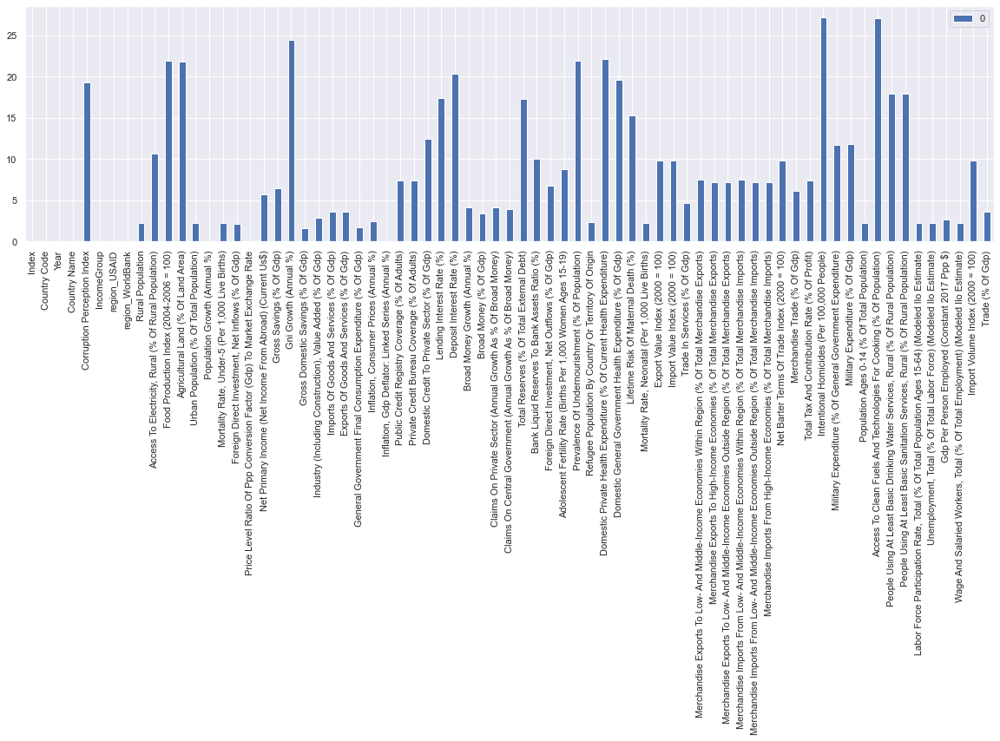

In [109]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Inflation, Gdp Deflator: Linked Series (Annual %)'].isnull(), 'Inflation, Gdp Deflator: Linked Series (Annual %)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Gross Domestic Savings (% Of Gdp)

In [110]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)','Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate','Gross Domestic Savings (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Gross Domestic Savings (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Gross Domestic Savings (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Gross Domestic Savings (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Gross Domestic Savings (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Gross Domestic Savings (% Of Gdp)'], axis = 1)

0.999172784689752


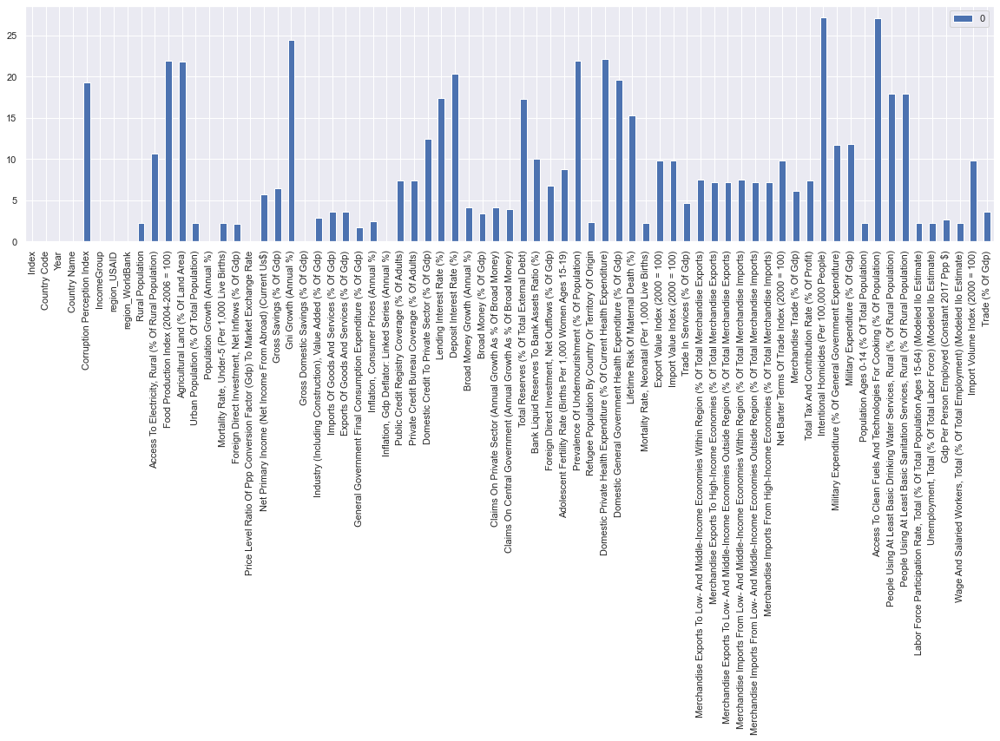

In [111]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Gross Domestic Savings (% Of Gdp)'].isnull(), 'Gross Domestic Savings (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## General Government Final Consumption Expenditure (% Of Gdp)

In [112]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)','Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate','Gross Domestic Savings (% Of Gdp)','General Government Final Consumption Expenditure (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['General Government Final Consumption Expenditure (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['General Government Final Consumption Expenditure (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['General Government Final Consumption Expenditure (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['General Government Final Consumption Expenditure (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['General Government Final Consumption Expenditure (% Of Gdp)'], axis = 1)

0.9984413496898988


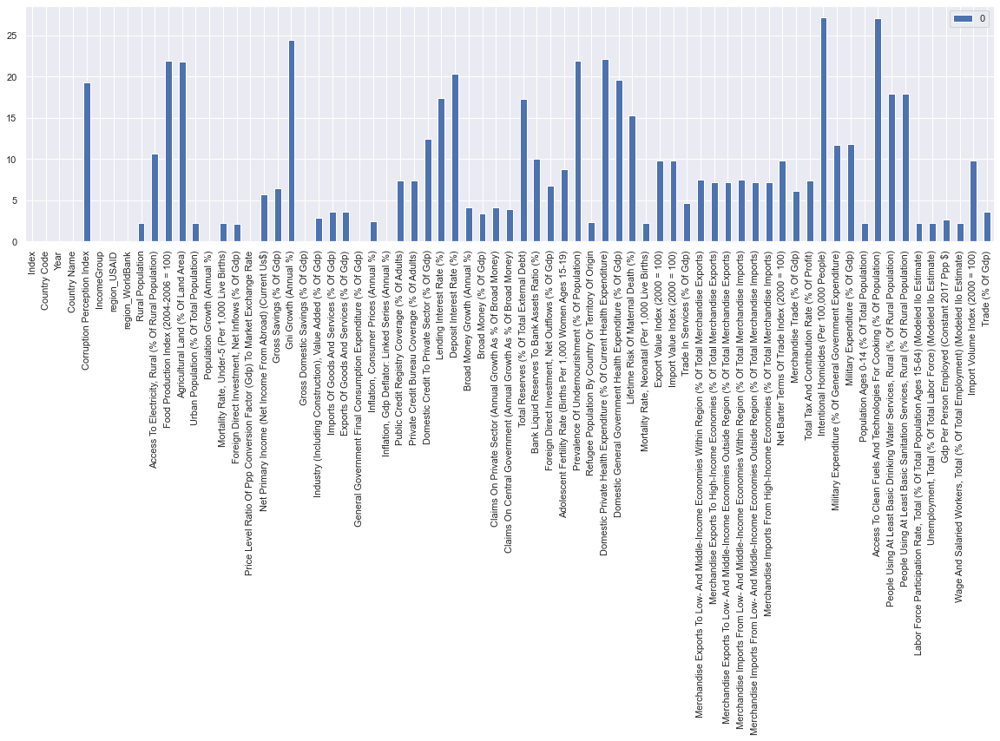

In [113]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['General Government Final Consumption Expenditure (% Of Gdp)'].isnull(), 'General Government Final Consumption Expenditure (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Foreign Direct Investment, Net Inflows (% Of Gdp)

In [114]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Foreign Direct Investment, Net Inflows (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Foreign Direct Investment, Net Inflows (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Foreign Direct Investment, Net Inflows (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Foreign Direct Investment, Net Inflows (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Foreign Direct Investment, Net Inflows (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Foreign Direct Investment, Net Inflows (% Of Gdp)'], axis = 1)

0.9970492721094892


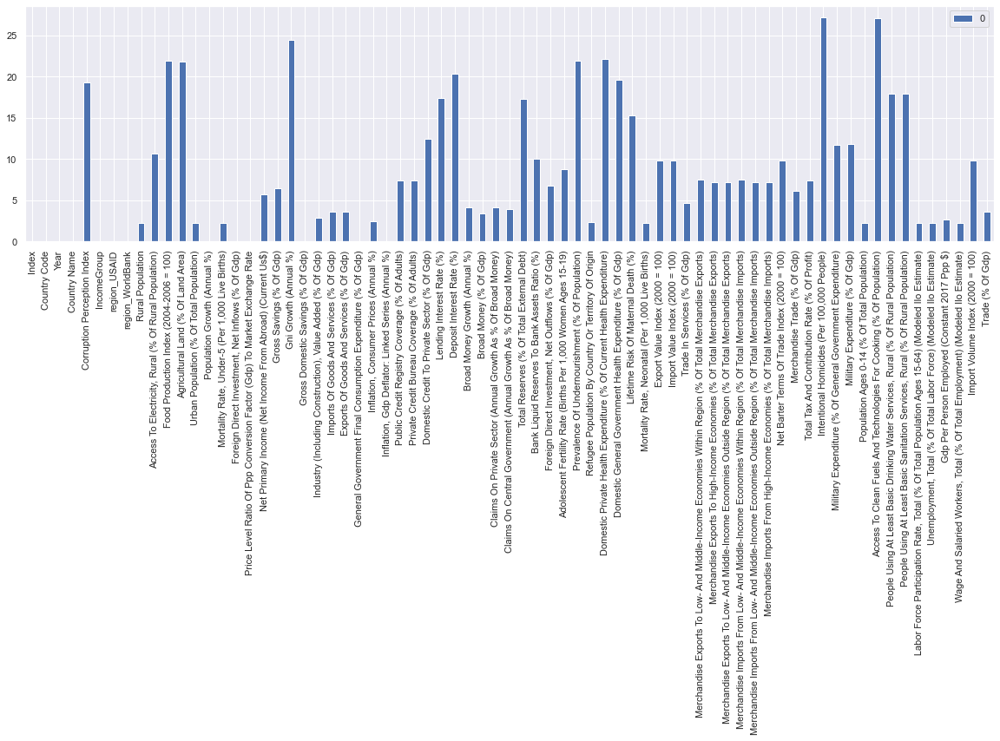

In [115]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Foreign Direct Investment, Net Inflows (% Of Gdp)'].isnull(), 'Foreign Direct Investment, Net Inflows (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Urban Population (% Of Total Population)

In [116]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Urban Population (% Of Total Population)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Urban Population (% Of Total Population)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Urban Population (% Of Total Population)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Urban Population (% Of Total Population)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Urban Population (% Of Total Population)'], axis = 1)

0.9998254966079495


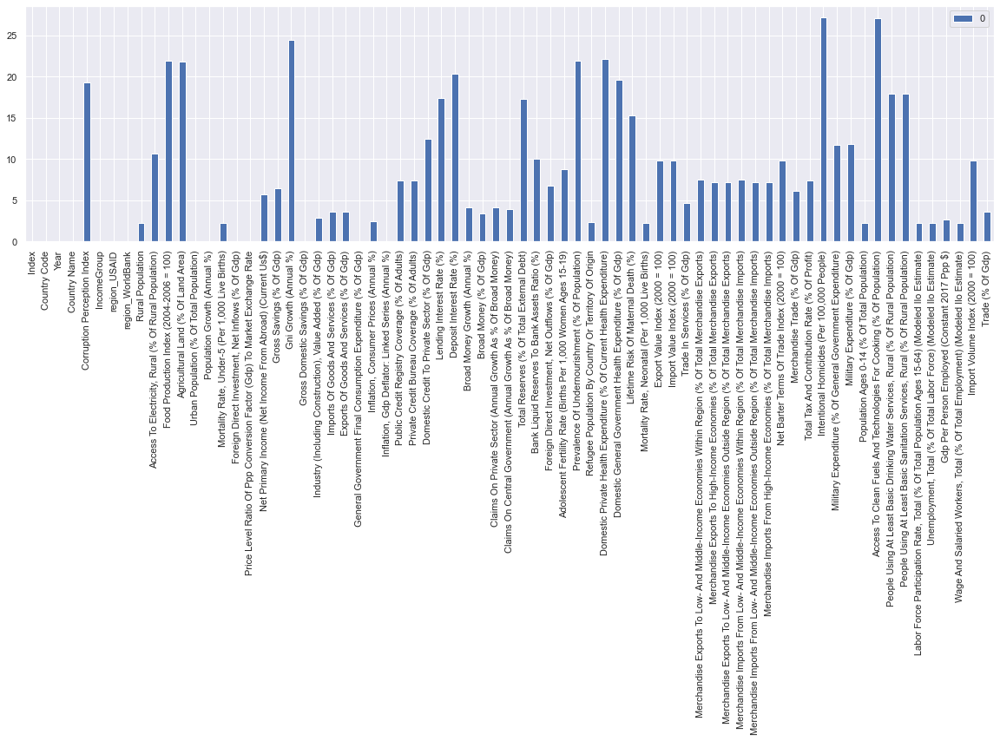

In [117]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Urban Population (% Of Total Population)'].isnull(), 'Urban Population (% Of Total Population)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Mortality Rate, Under-5 (Per 1,000 Live Births) 

In [118]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Mortality Rate, Under-5 (Per 1,000 Live Births)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Mortality Rate, Under-5 (Per 1,000 Live Births)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Mortality Rate, Under-5 (Per 1,000 Live Births)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Mortality Rate, Under-5 (Per 1,000 Live Births)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Mortality Rate, Under-5 (Per 1,000 Live Births)'], axis = 1)

0.9990926446690575


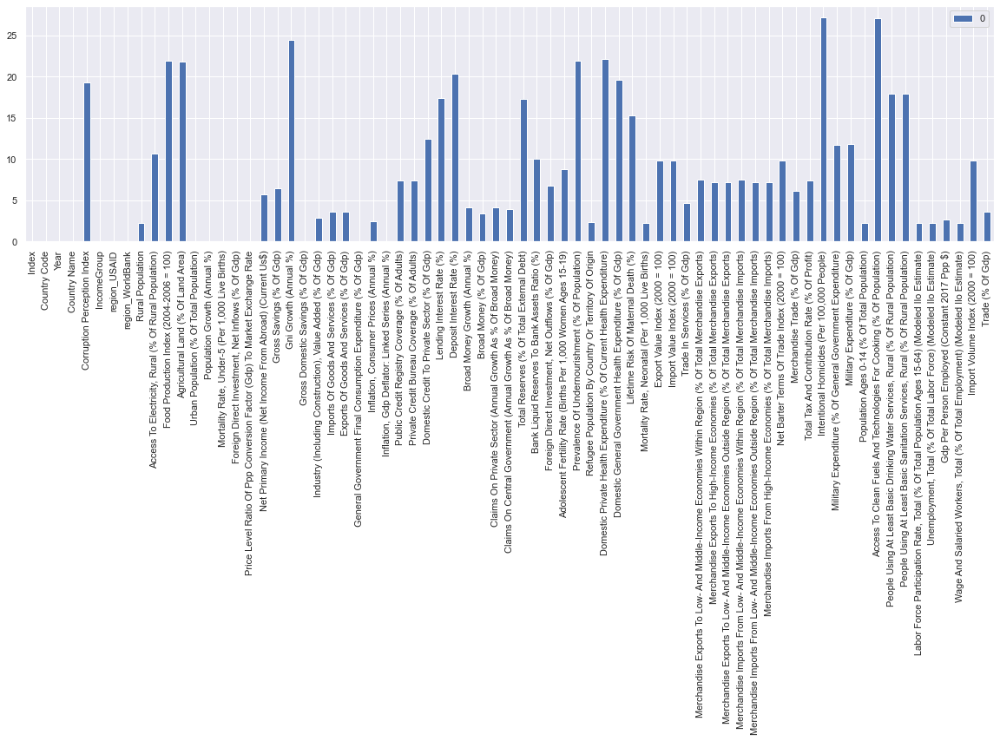

In [119]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Mortality Rate, Under-5 (Per 1,000 Live Births)'].isnull(), 'Mortality Rate, Under-5 (Per 1,000 Live Births)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Mortality Rate, Neonatal (Per 1,000 Live Births)

In [120]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',

                                  'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Mortality Rate, Neonatal (Per 1,000 Live Births)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Mortality Rate, Neonatal (Per 1,000 Live Births)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Mortality Rate, Neonatal (Per 1,000 Live Births)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Mortality Rate, Neonatal (Per 1,000 Live Births)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Mortality Rate, Neonatal (Per 1,000 Live Births)'], axis = 1)

0.999942341883504


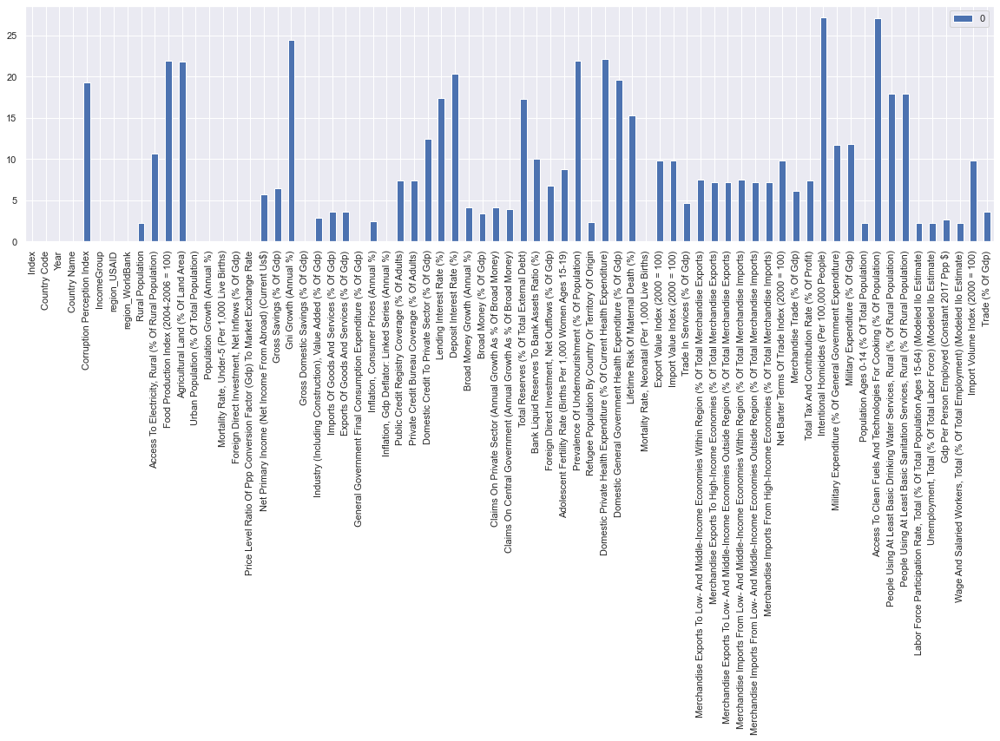

In [121]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Mortality Rate, Neonatal (Per 1,000 Live Births)'].isnull(), 'Mortality Rate, Neonatal (Per 1,000 Live Births)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Population Ages 0-14 (% Of Total Population)

In [122]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID','region_WorldBank',
    'Population Growth (Annual %)','Urban Population (% Of Total Population)',
    'Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Population Ages 0-14 (% Of Total Population)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Population Ages 0-14 (% Of Total Population)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Population Ages 0-14 (% Of Total Population)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Population Ages 0-14 (% Of Total Population)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Population Ages 0-14 (% Of Total Population)'], axis = 1)

0.9999480141517962


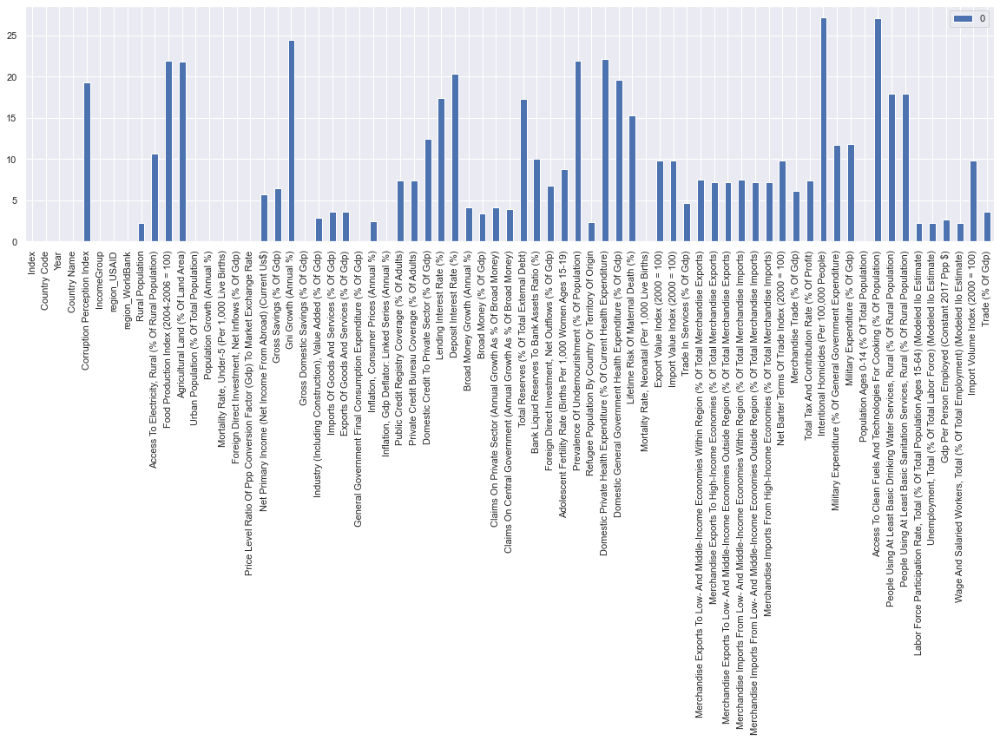

In [123]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Population Ages 0-14 (% Of Total Population)'].isnull(), 'Population Ages 0-14 (% Of Total Population)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)(Per 1,000 Live Births) 

In [124]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)'], axis = 1)

0.9998703153337789


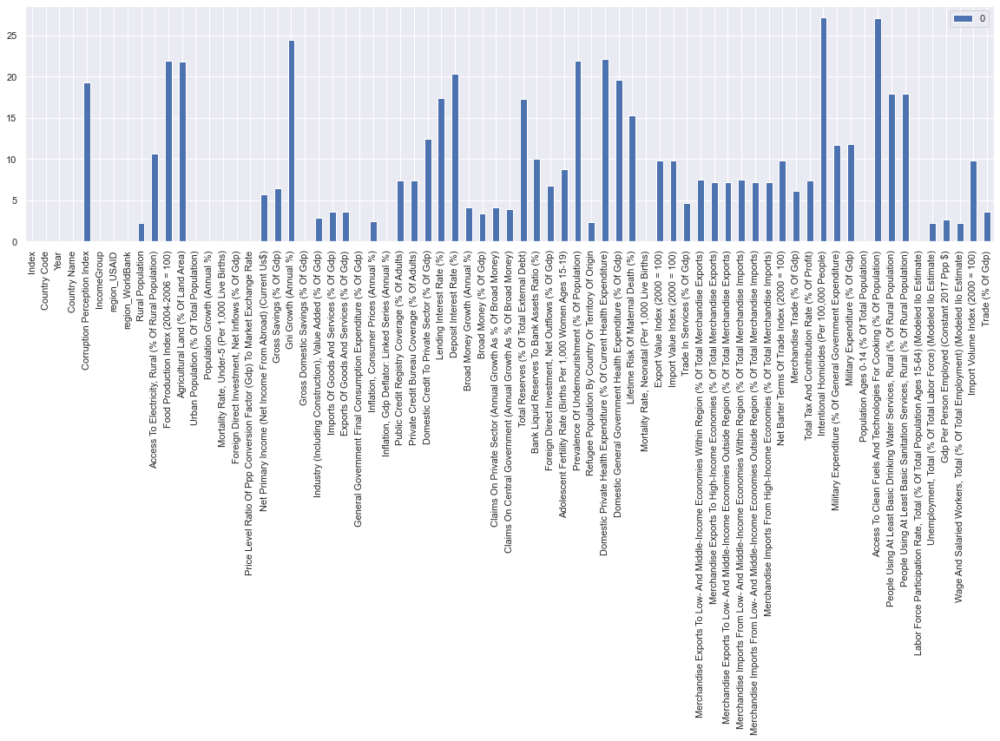

In [125]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)'].isnull(), 'Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)

In [126]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)'], axis = 1)

0.9997875025154135


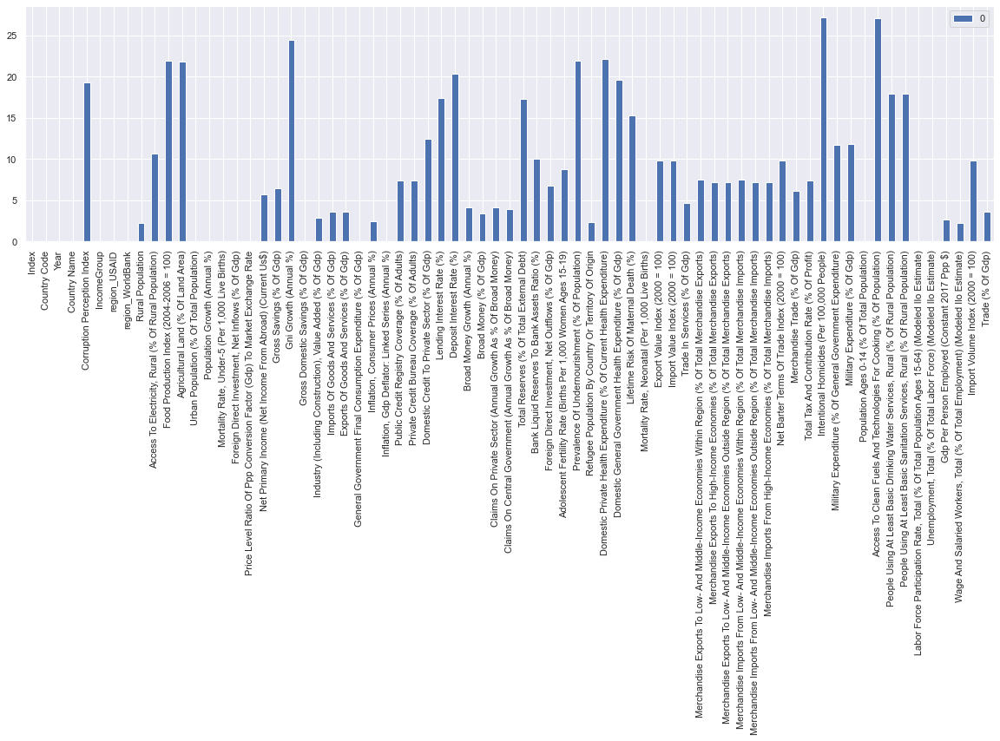

In [127]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)'].isnull(), 'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate) 

In [128]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)'], axis = 1)

0.9997843718606559


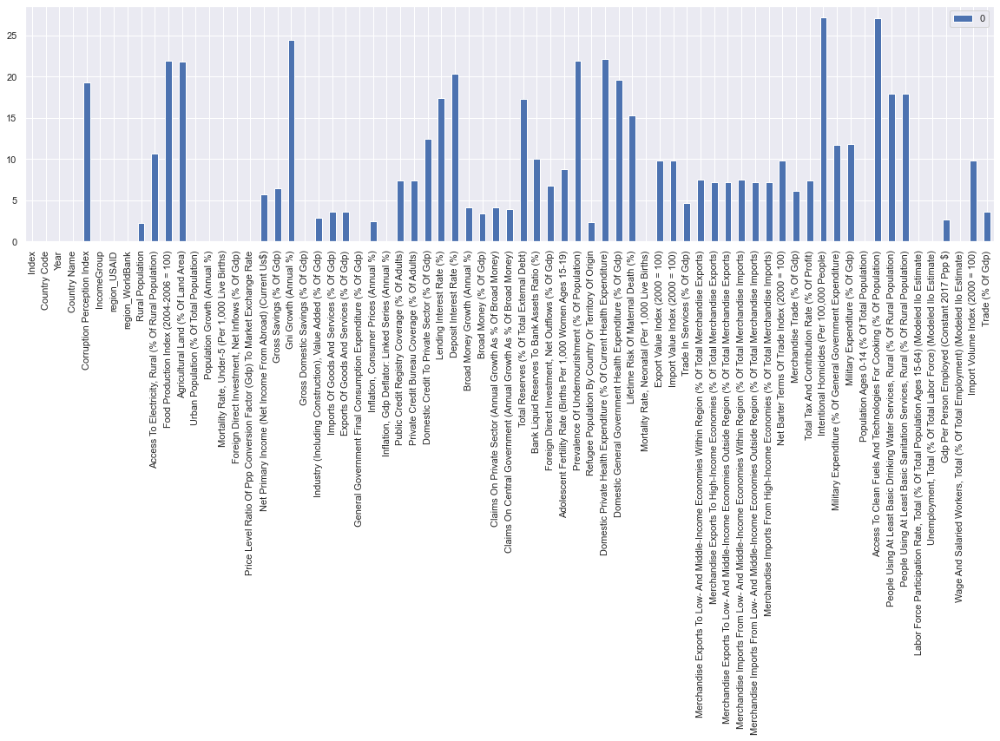

In [129]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)'].isnull(), 'Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Refugee Population By Country Or Territory Of Origin 

In [130]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                 'Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Refugee Population By Country Or Territory Of Origin'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Refugee Population By Country Or Territory Of Origin'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Refugee Population By Country Or Territory Of Origin'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Refugee Population By Country Or Territory Of Origin']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Refugee Population By Country Or Territory Of Origin'], axis = 1)

0.9999933984798058


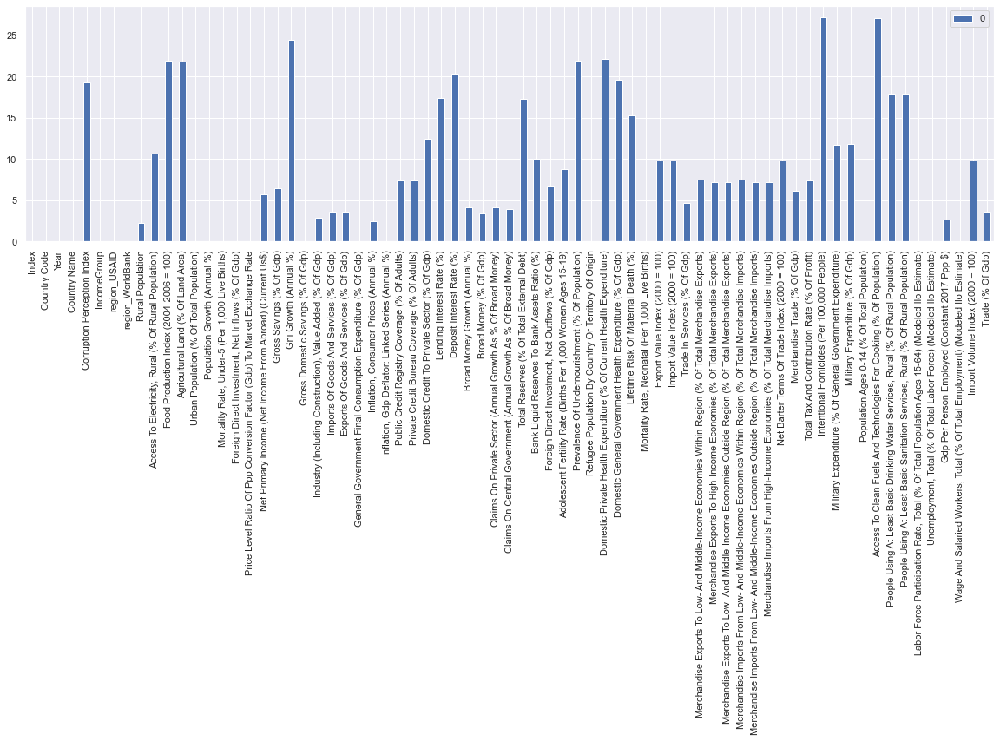

In [131]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Refugee Population By Country Or Territory Of Origin'].isnull(), 'Refugee Population By Country Or Territory Of Origin'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Inflation, Consumer Prices (Annual %) 

In [132]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Inflation, Consumer Prices (Annual %)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Inflation, Consumer Prices (Annual %)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Inflation, Consumer Prices (Annual %)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Inflation, Consumer Prices (Annual %)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Inflation, Consumer Prices (Annual %)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Inflation, Consumer Prices (Annual %)'], axis = 1)

0.9863091375475035


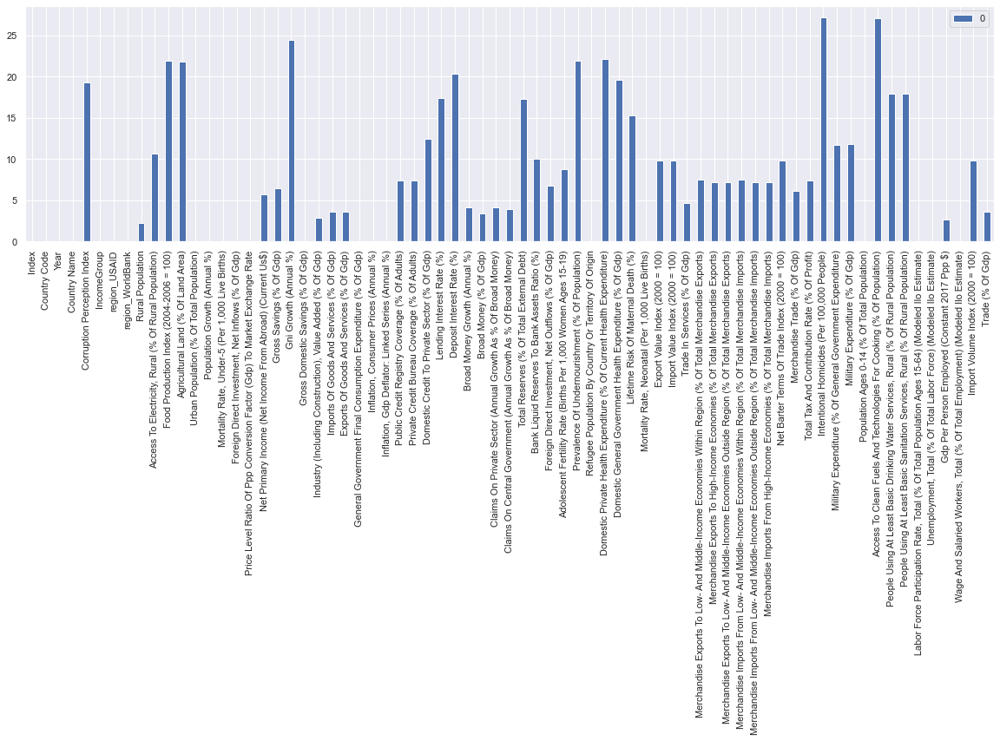

In [133]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Inflation, Consumer Prices (Annual %)'].isnull(), 'Inflation, Consumer Prices (Annual %)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Gdp Per Person Employed (Constant 2017 Ppp) 

In [134]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)','Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                  'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                 'Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
        'Gdp Per Person Employed (Constant 2017 Ppp $)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Gdp Per Person Employed (Constant 2017 Ppp $)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Gdp Per Person Employed (Constant 2017 Ppp $)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Gdp Per Person Employed (Constant 2017 Ppp $)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Gdp Per Person Employed (Constant 2017 Ppp $)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Gdp Per Person Employed (Constant 2017 Ppp $)'], axis = 1)

0.9994287738610591


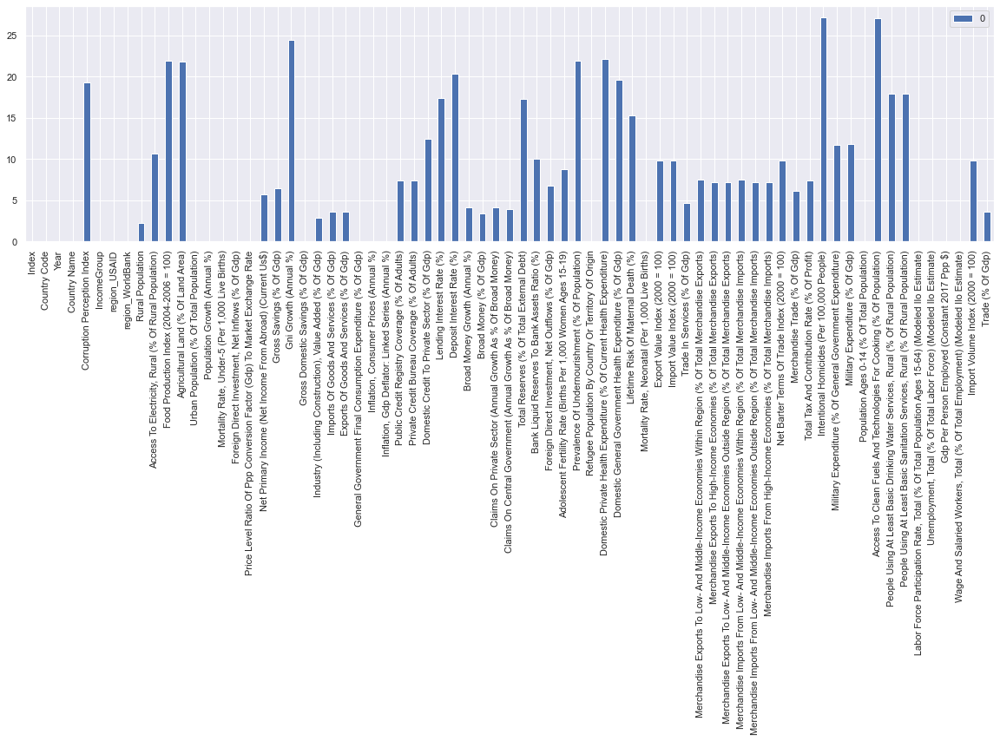

In [135]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Gdp Per Person Employed (Constant 2017 Ppp $)'].isnull(), 'Gdp Per Person Employed (Constant 2017 Ppp $)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Industry (Including Construction), Value Added (% Of Gdp)

In [136]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Industry (Including Construction), Value Added (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Industry (Including Construction), Value Added (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Industry (Including Construction), Value Added (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Industry (Including Construction), Value Added (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Industry (Including Construction), Value Added (% Of Gdp)'], axis = 1)

0.9989379481084886


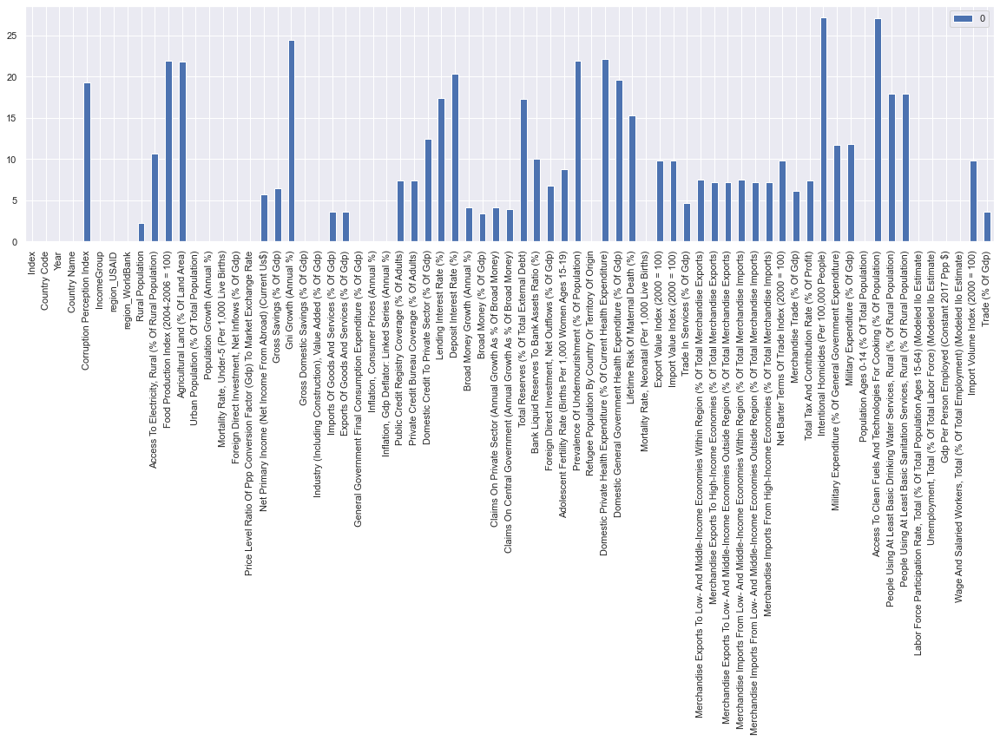

In [137]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Industry (Including Construction), Value Added (% Of Gdp)'].isnull(), 'Industry (Including Construction), Value Added (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Broad Money (% Of Gdp) 

In [138]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)','Gross Domestic Savings (% Of Gdp)','Urban Population (% Of Total Population)',
                                   'Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Broad Money (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Broad Money (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Broad Money (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Broad Money (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Broad Money (% Of Gdp)'], axis = 1)

0.9994769296089436


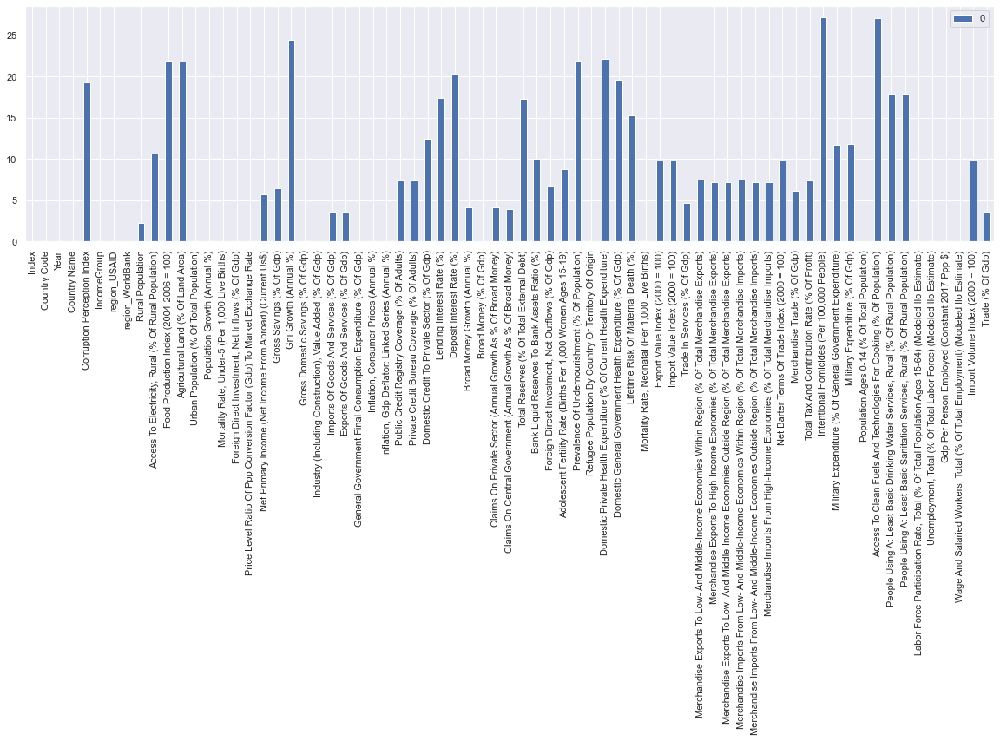

In [139]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Broad Money (% Of Gdp)'].isnull(), 'Broad Money (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Imports Of Goods And Services (% Of Gdp) 

In [140]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
'Imports Of Goods And Services (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Imports Of Goods And Services (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Imports Of Goods And Services (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Imports Of Goods And Services (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Imports Of Goods And Services (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Imports Of Goods And Services (% Of Gdp)'], axis = 1)

0.9978075756636101


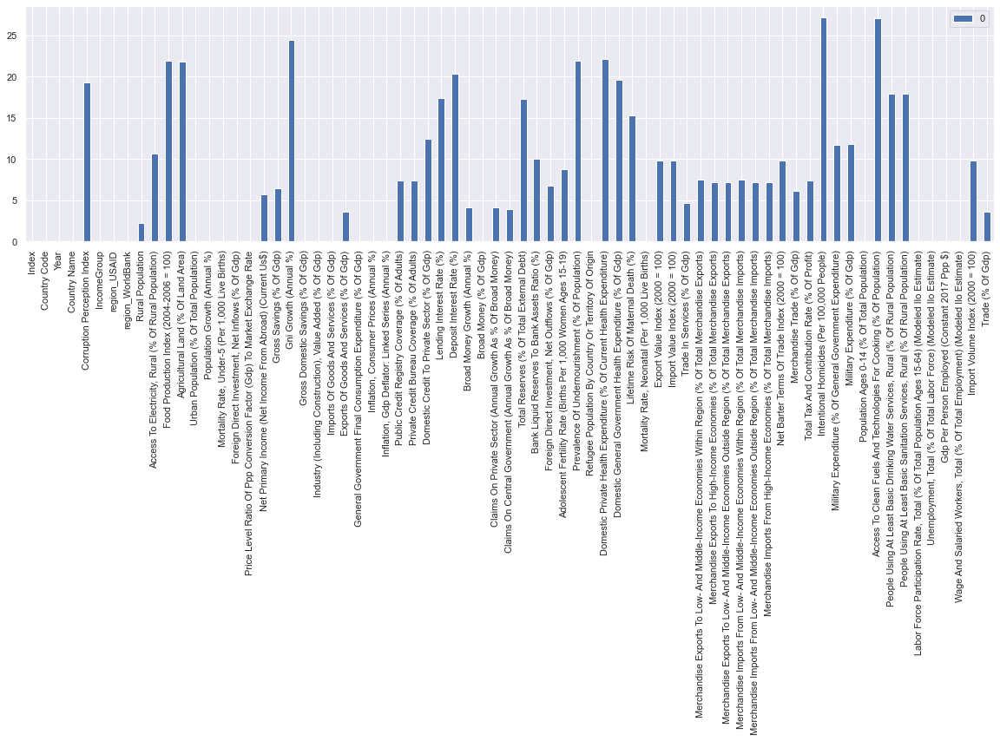

In [141]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Imports Of Goods And Services (% Of Gdp)'].isnull(), 'Imports Of Goods And Services (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Exports Of Goods And Services (% Of Gdp) 

In [142]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
'Imports Of Goods And Services (% Of Gdp)','Exports Of Goods And Services (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Exports Of Goods And Services (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Exports Of Goods And Services (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Exports Of Goods And Services (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Exports Of Goods And Services (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Exports Of Goods And Services (% Of Gdp)'], axis = 1)

0.9978711553840899


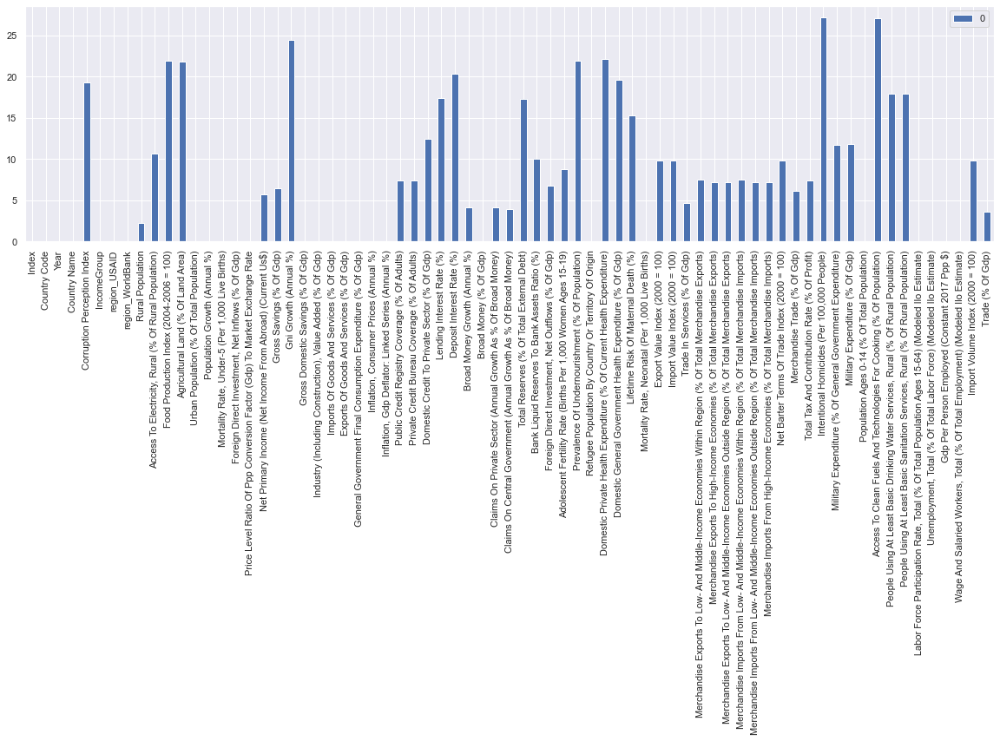

In [143]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Exports Of Goods And Services (% Of Gdp)'].isnull(), 'Exports Of Goods And Services (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Trade (% Of Gdp) 

In [144]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
'Imports Of Goods And Services (% Of Gdp)','Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Trade (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Trade (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Trade (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Trade (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Trade (% Of Gdp)'], axis = 1)

0.9996905950459476


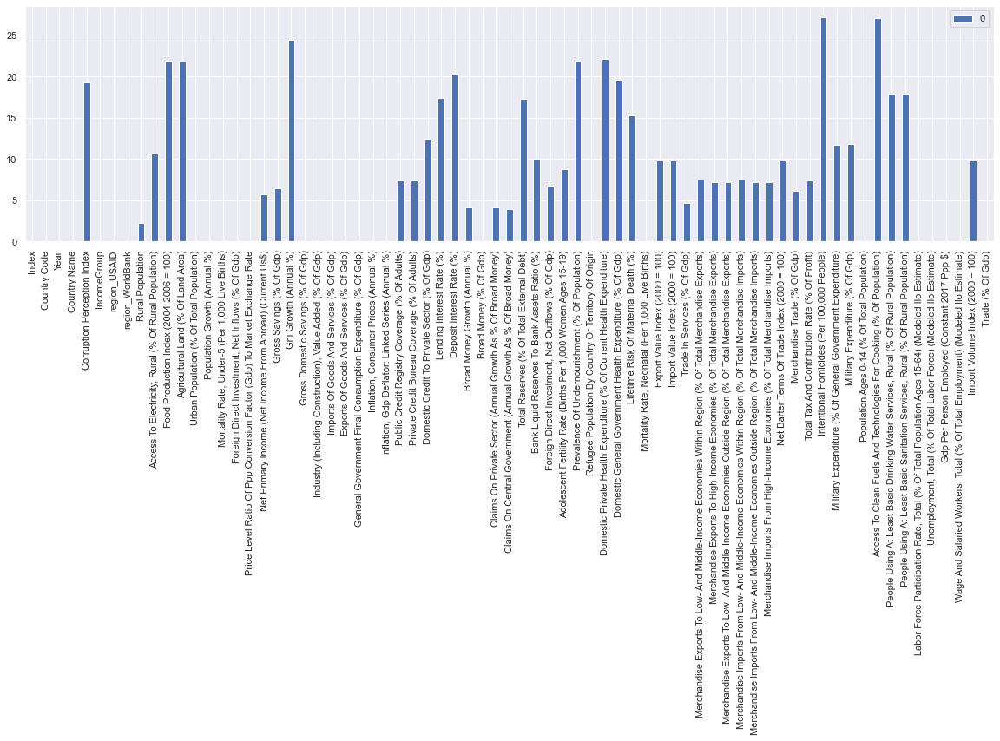

In [145]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Trade (% Of Gdp)'].isnull(), 'Trade (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Claims On Central Government (Annual Growth As % Of Broad Money)

In [146]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Claims On Central Government (Annual Growth As % Of Broad Money)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Claims On Central Government (Annual Growth As % Of Broad Money)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Claims On Central Government (Annual Growth As % Of Broad Money)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Claims On Central Government (Annual Growth As % Of Broad Money)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Claims On Central Government (Annual Growth As % Of Broad Money)'], axis = 1)

0.9845436981467449


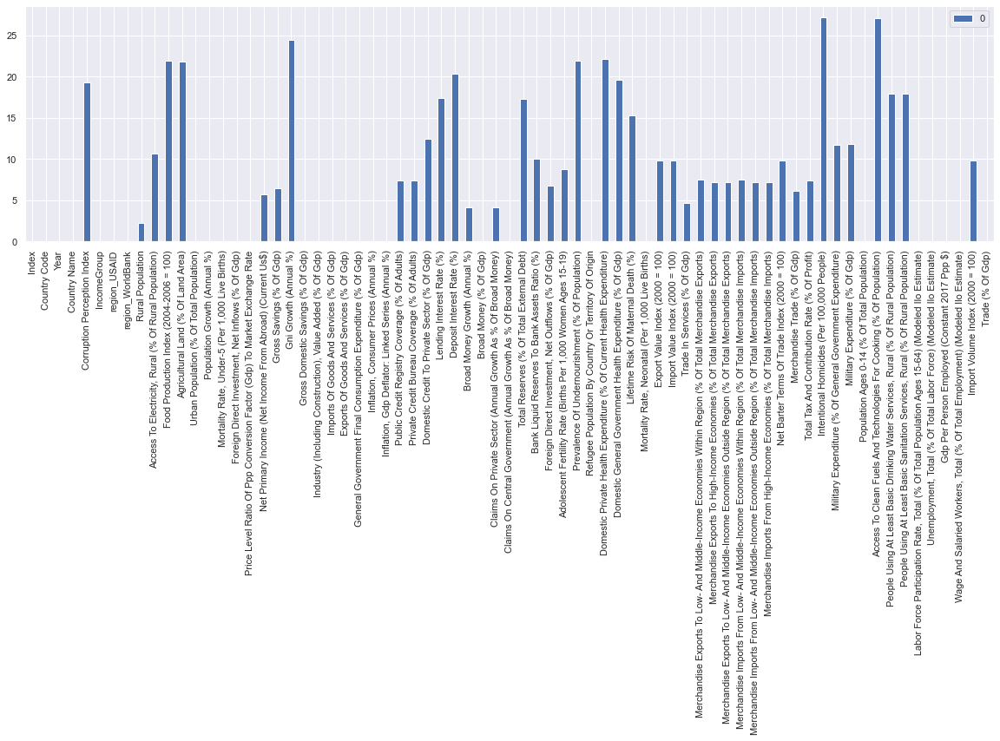

In [147]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Claims On Central Government (Annual Growth As % Of Broad Money)'].isnull(), 
       'Claims On Central Government (Annual Growth As % Of Broad Money)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Claims On Private Sector (Annual Growth As % Of Broad Money)

In [148]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Claims On Private Sector (Annual Growth As % Of Broad Money)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Claims On Private Sector (Annual Growth As % Of Broad Money)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Claims On Private Sector (Annual Growth As % Of Broad Money)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Claims On Private Sector (Annual Growth As % Of Broad Money)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Claims On Private Sector (Annual Growth As % Of Broad Money)'], axis = 1)

0.9965968298464732


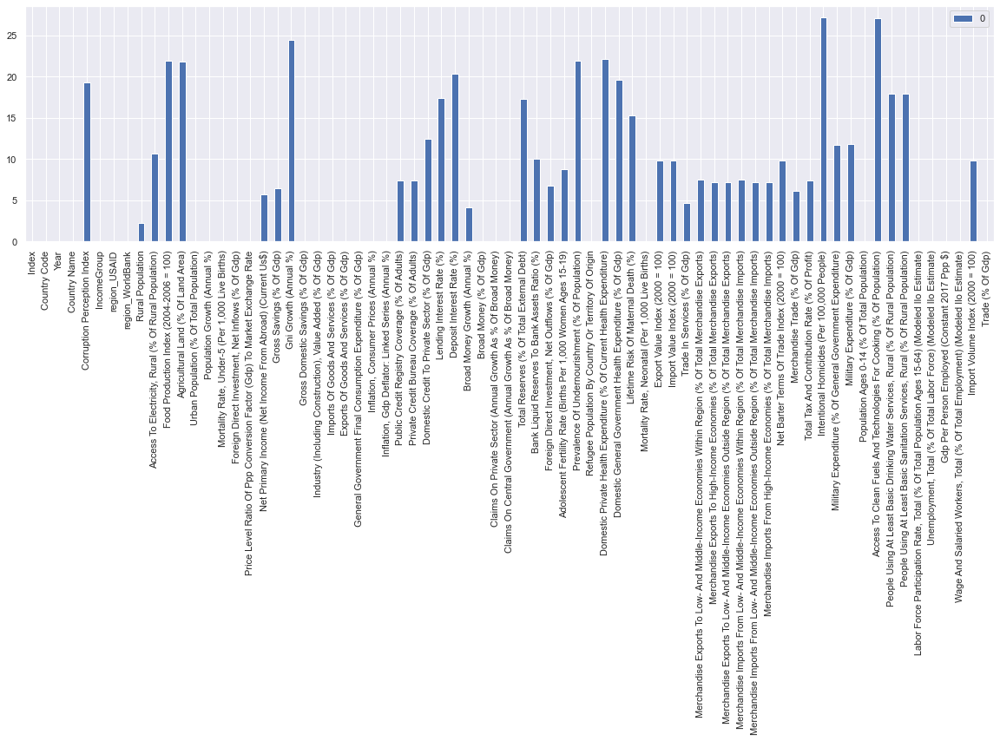

In [149]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Claims On Private Sector (Annual Growth As % Of Broad Money)'].isnull(), 
       'Claims On Private Sector (Annual Growth As % Of Broad Money)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Broad Money Growth (Annual %)

In [150]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Broad Money Growth (Annual %)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Broad Money Growth (Annual %)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Broad Money Growth (Annual %)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Broad Money Growth (Annual %)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Broad Money Growth (Annual %)'], axis = 1)

0.9928357303569505


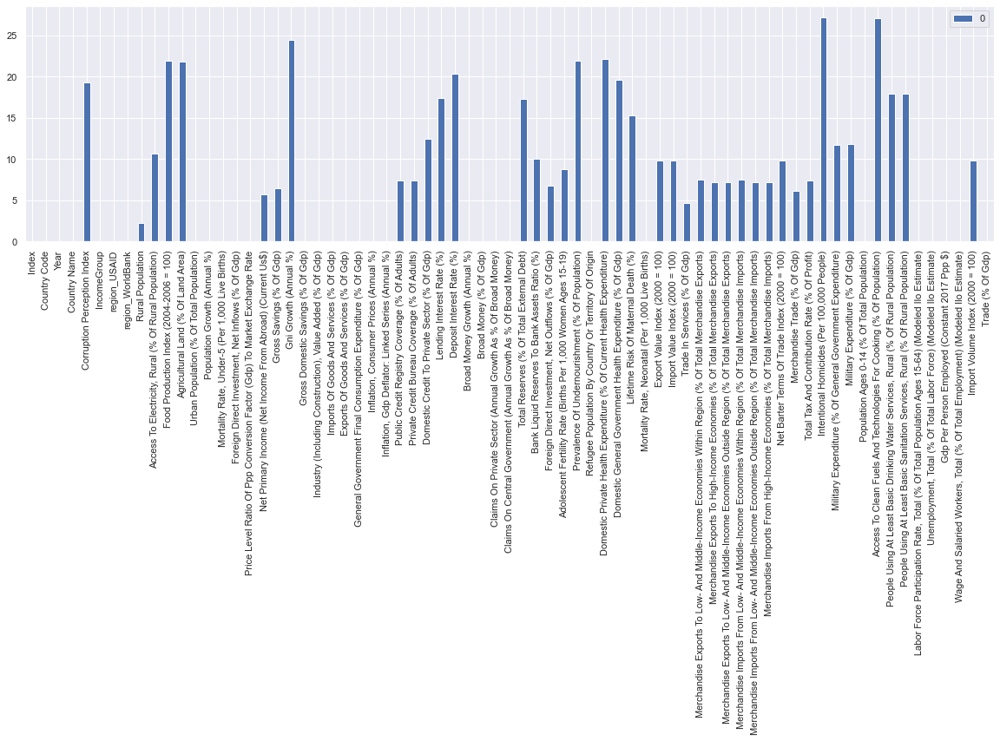

In [151]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Broad Money Growth (Annual %)'].isnull(), 
       'Broad Money Growth (Annual %)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Trade In Services (% Of Gdp)

In [152]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Trade In Services (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Trade In Services (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Trade In Services (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Trade In Services (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Trade In Services (% Of Gdp)'], axis = 1)

0.9987675727330314


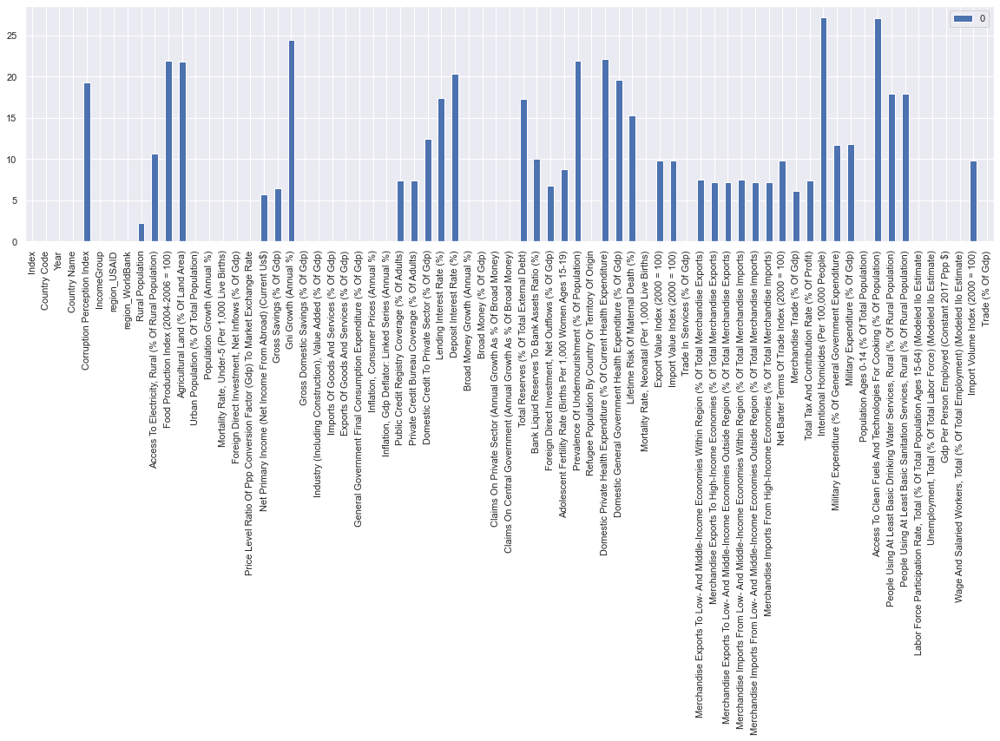

In [153]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Trade In Services (% Of Gdp)'].isnull(), 
       'Trade In Services (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Net Primary Income (Net Income From Abroad) (Current Us$)

In [154]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Net Primary Income (Net Income From Abroad) (Current Us$)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Net Primary Income (Net Income From Abroad) (Current Us$)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Net Primary Income (Net Income From Abroad) (Current Us$)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Net Primary Income (Net Income From Abroad) (Current Us$)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Net Primary Income (Net Income From Abroad) (Current Us$)'], axis = 1)

0.9998171890396482


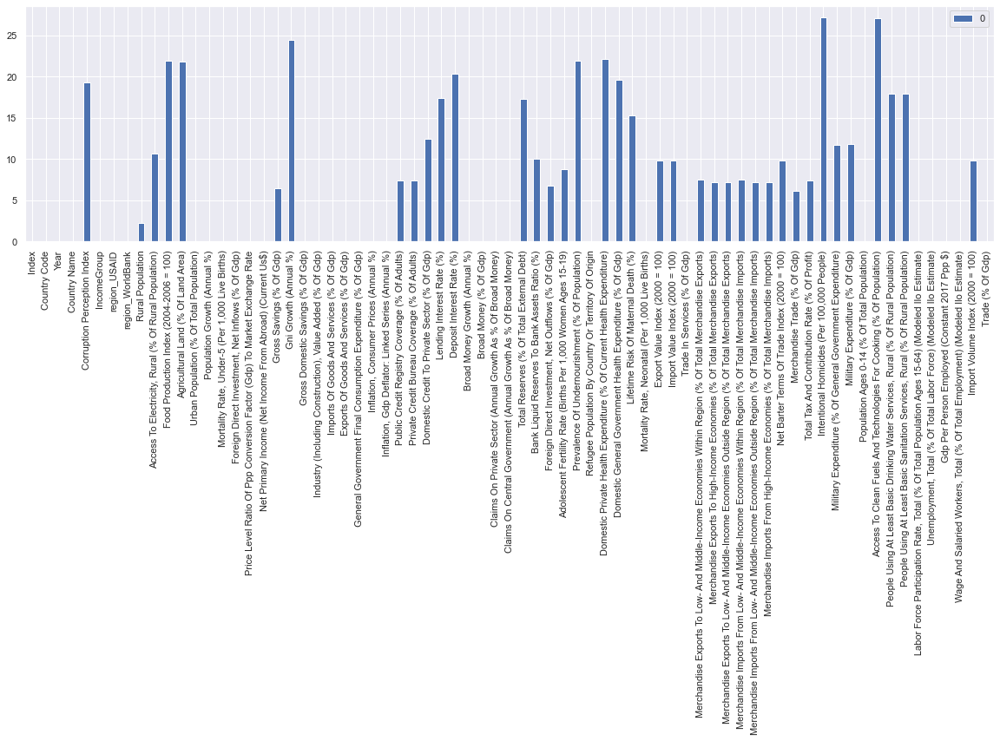

In [155]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Net Primary Income (Net Income From Abroad) (Current Us$)'].isnull(), 
       'Net Primary Income (Net Income From Abroad) (Current Us$)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Trade (% Of Gdp)

In [156]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Trade (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Trade (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Trade (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Trade (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Trade (% Of Gdp)'], axis = 1)

0.9987107150525845


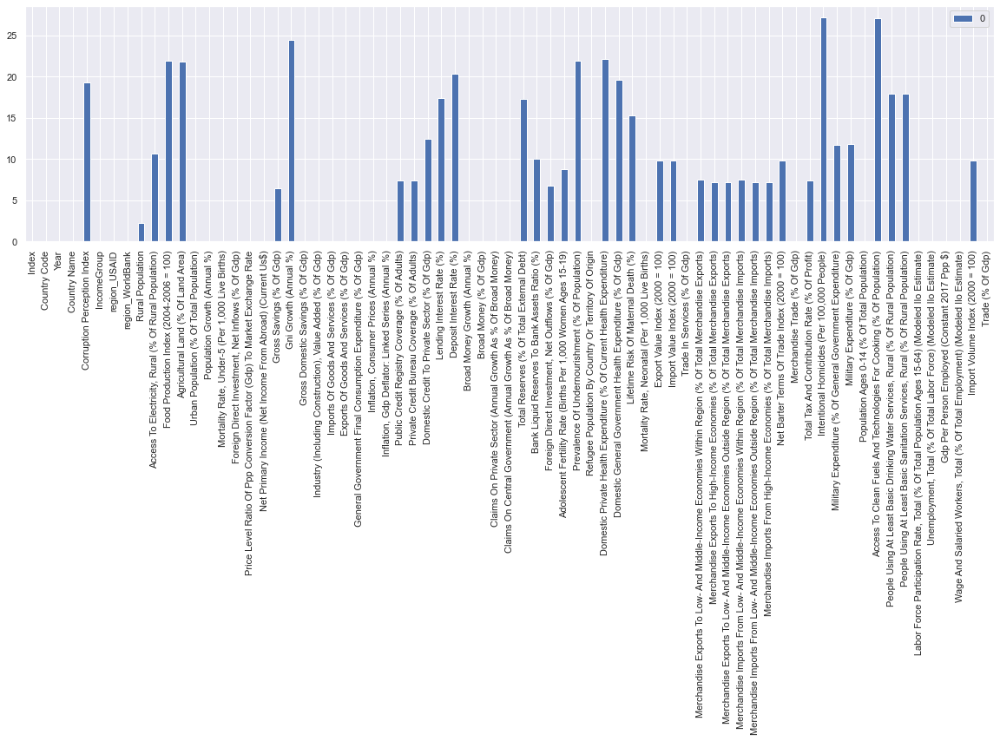

In [157]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Trade (% Of Gdp)'].isnull(), 
       'Merchandise Trade (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Gross Savings (% Of Gdp)

In [158]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)',
                                  'Gross Savings (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Gross Savings (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Gross Savings (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Gross Savings (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Gross Savings (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Gross Savings (% Of Gdp)'], axis = 1)

0.9990852328434425


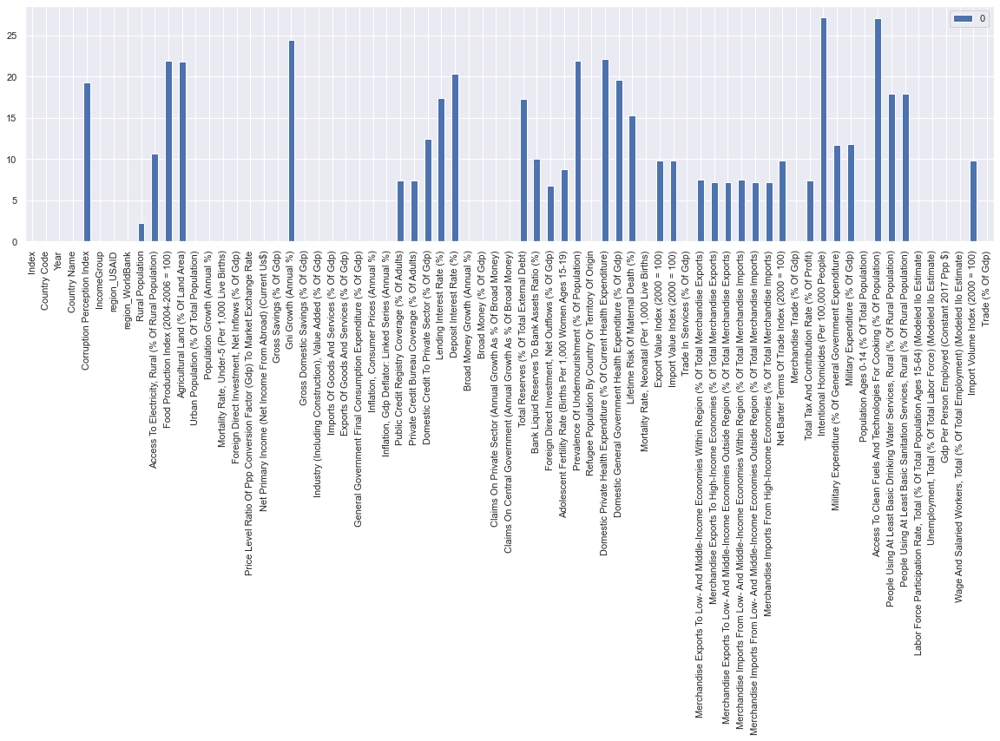

In [159]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Gross Savings (% Of Gdp)'].isnull(), 
       'Gross Savings (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Foreign Direct Investment, Net Outflows (% Of Gdp)

In [160]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Foreign Direct Investment, Net Outflows (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Foreign Direct Investment, Net Outflows (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Foreign Direct Investment, Net Outflows (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Foreign Direct Investment, Net Outflows (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Foreign Direct Investment, Net Outflows (% Of Gdp)'], axis = 1)

0.997908643958068


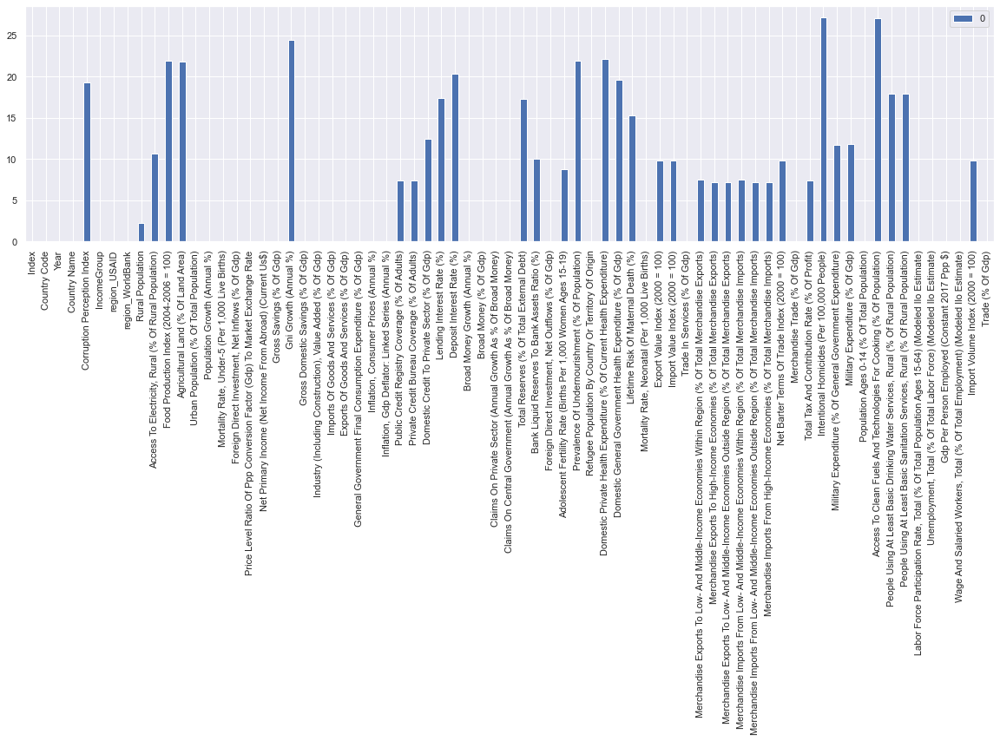

In [161]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Foreign Direct Investment, Net Outflows (% Of Gdp)'].isnull(), 
       'Foreign Direct Investment, Net Outflows (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)

In [162]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)'], axis = 1)

0.9986355111021911


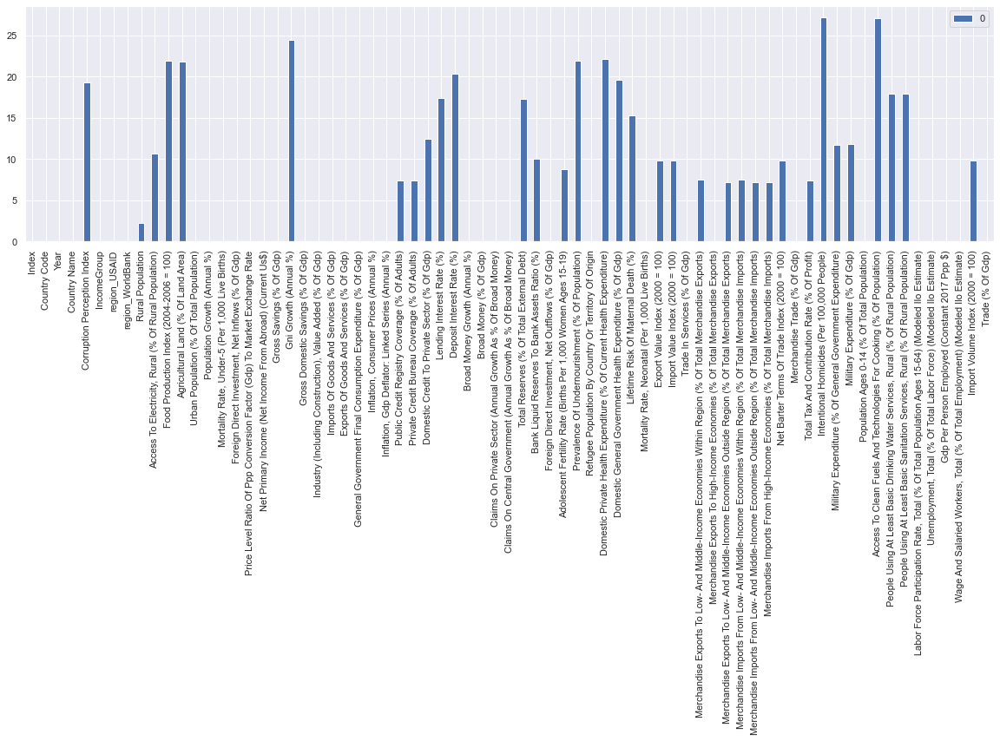

In [163]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)'].isnull(), 
       'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)

In [164]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)'], axis = 1)

0.9974668963913816


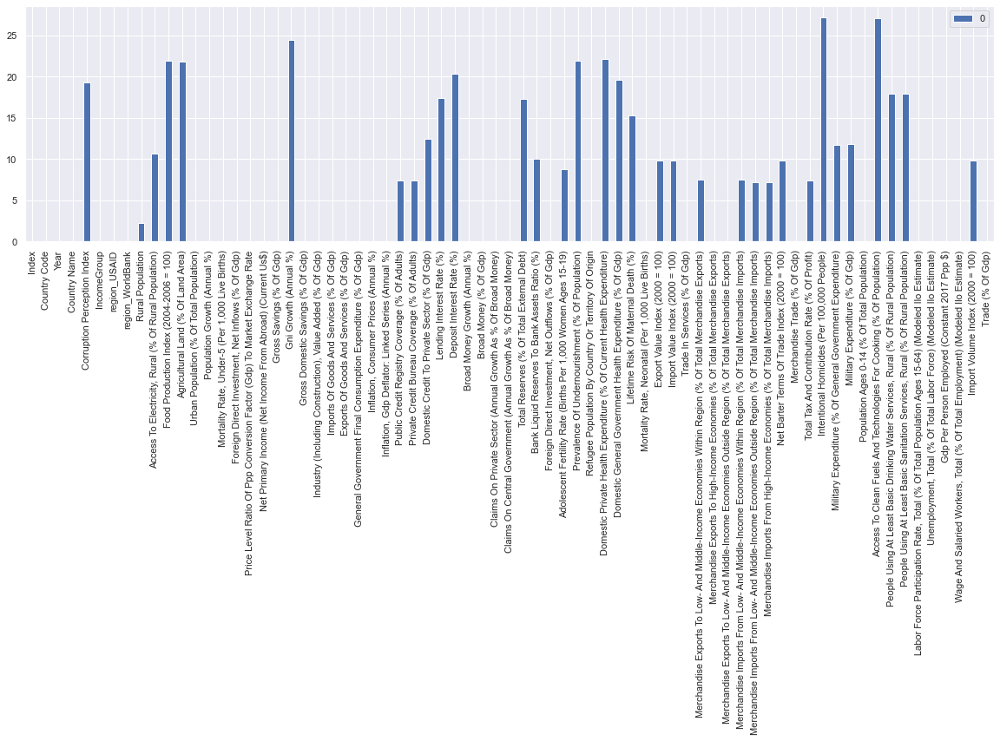

In [165]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)'].isnull(), 
       'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)

In [166]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)'], axis = 1)

0.9993152268275108


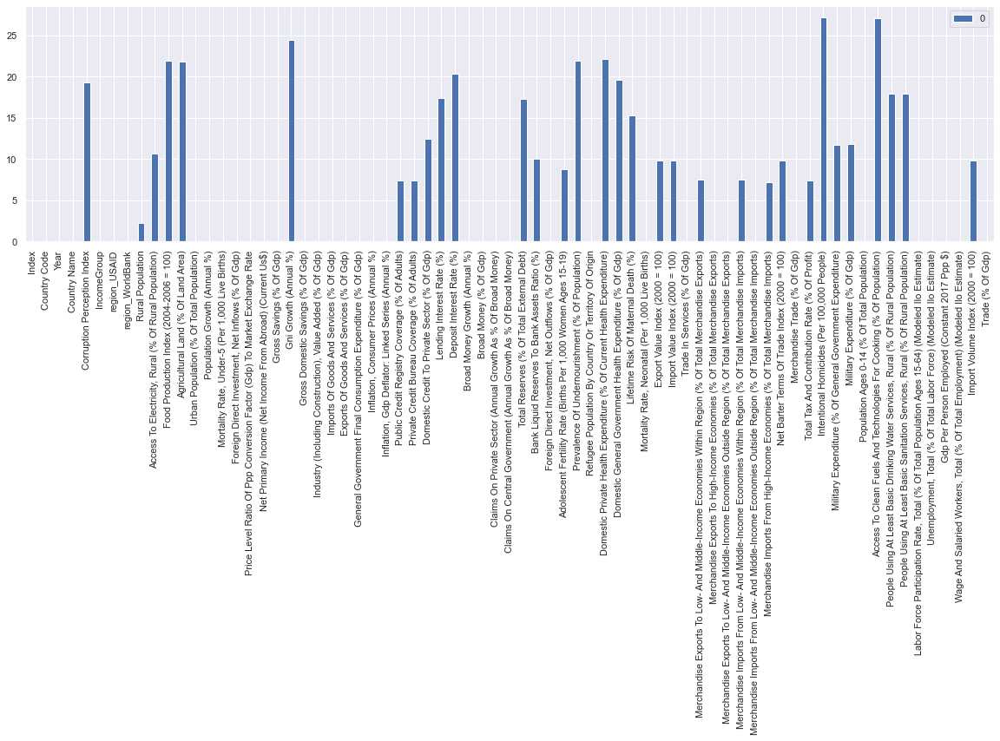

In [167]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)'].isnull(), 
       'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)

In [168]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)'], axis = 1)

0.9991413505013979


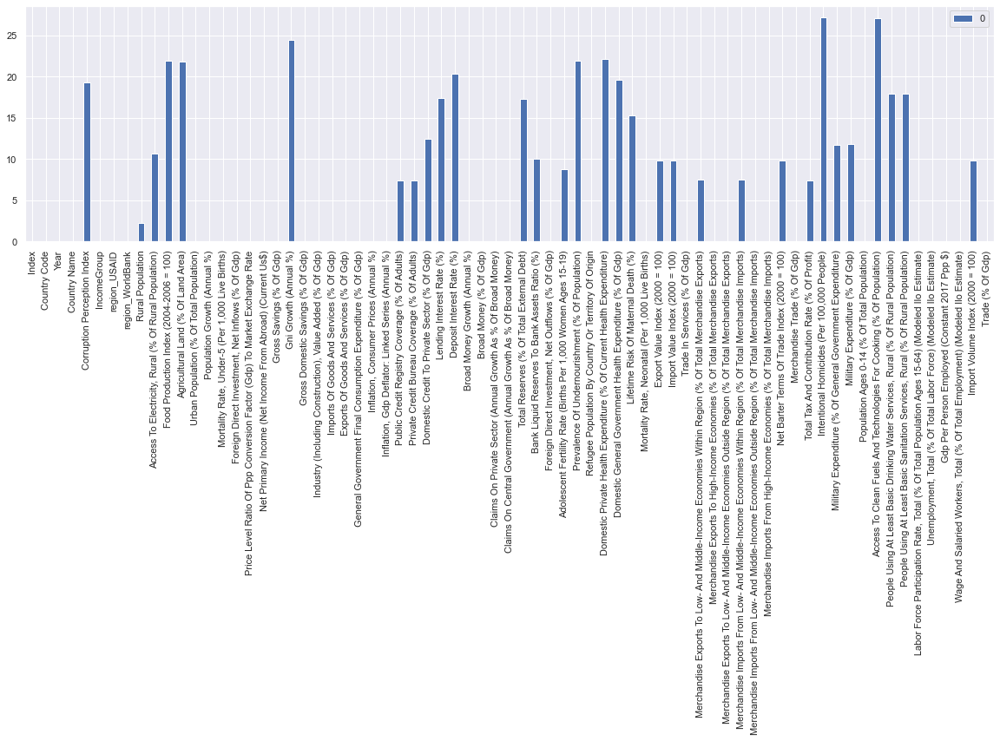

In [169]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)'].isnull(), 
       'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Public Credit Registry Coverage (% Of Adults)

In [170]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Public Credit Registry Coverage (% Of Adults)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Public Credit Registry Coverage (% Of Adults)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Public Credit Registry Coverage (% Of Adults)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Public Credit Registry Coverage (% Of Adults)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Public Credit Registry Coverage (% Of Adults)'], axis = 1)

0.9995396460341903


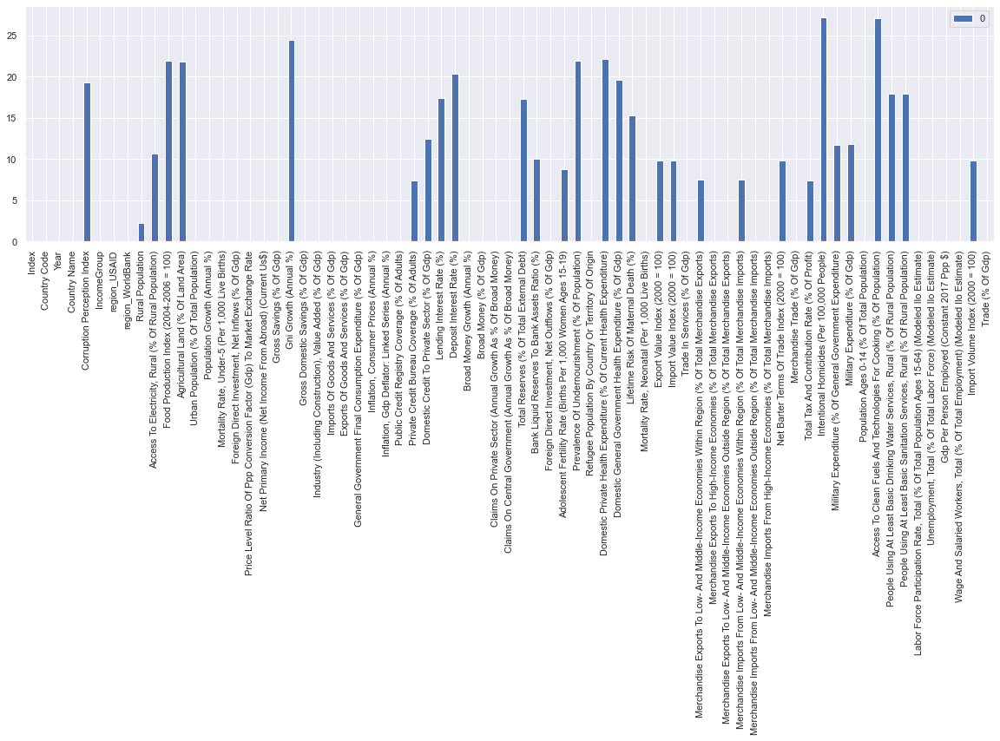

In [171]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Public Credit Registry Coverage (% Of Adults)'].isnull(), 
       'Public Credit Registry Coverage (% Of Adults)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Private Credit Bureau Coverage (% Of Adults)

In [172]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Private Credit Bureau Coverage (% Of Adults)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Private Credit Bureau Coverage (% Of Adults)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Private Credit Bureau Coverage (% Of Adults)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Private Credit Bureau Coverage (% Of Adults)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Private Credit Bureau Coverage (% Of Adults)'], axis = 1)

0.9996232962076387


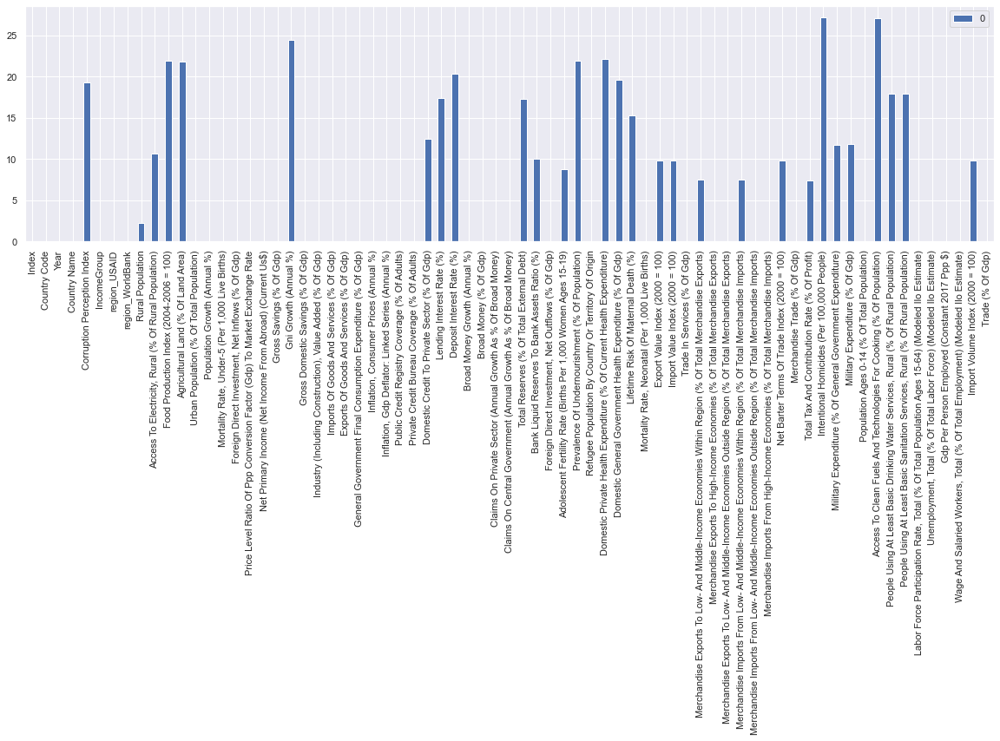

In [173]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Private Credit Bureau Coverage (% Of Adults)'].isnull(), 
       'Private Credit Bureau Coverage (% Of Adults)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Total Tax And Contribution Rate (% Of Profit)

In [174]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Total Tax And Contribution Rate (% Of Profit)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Total Tax And Contribution Rate (% Of Profit)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Total Tax And Contribution Rate (% Of Profit)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Total Tax And Contribution Rate (% Of Profit)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Total Tax And Contribution Rate (% Of Profit)'], axis = 1)

0.9942290791904361


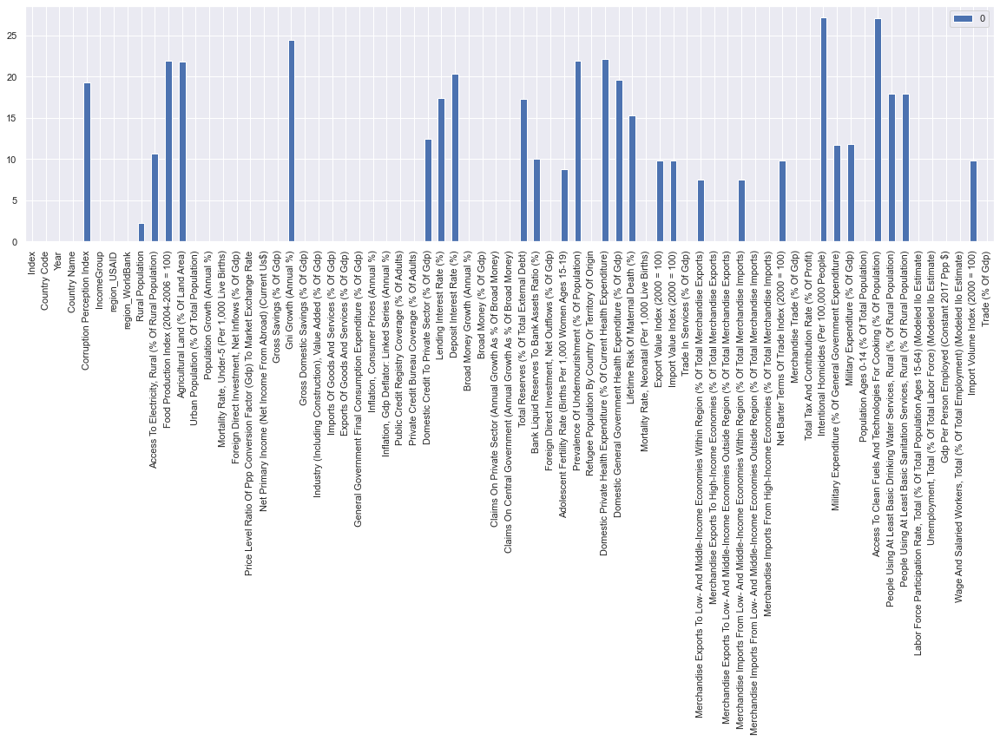

In [175]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Total Tax And Contribution Rate (% Of Profit)'].isnull(), 
       'Total Tax And Contribution Rate (% Of Profit)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)

In [176]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)','Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)']])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)'], axis = 1)

0.9996508592506228


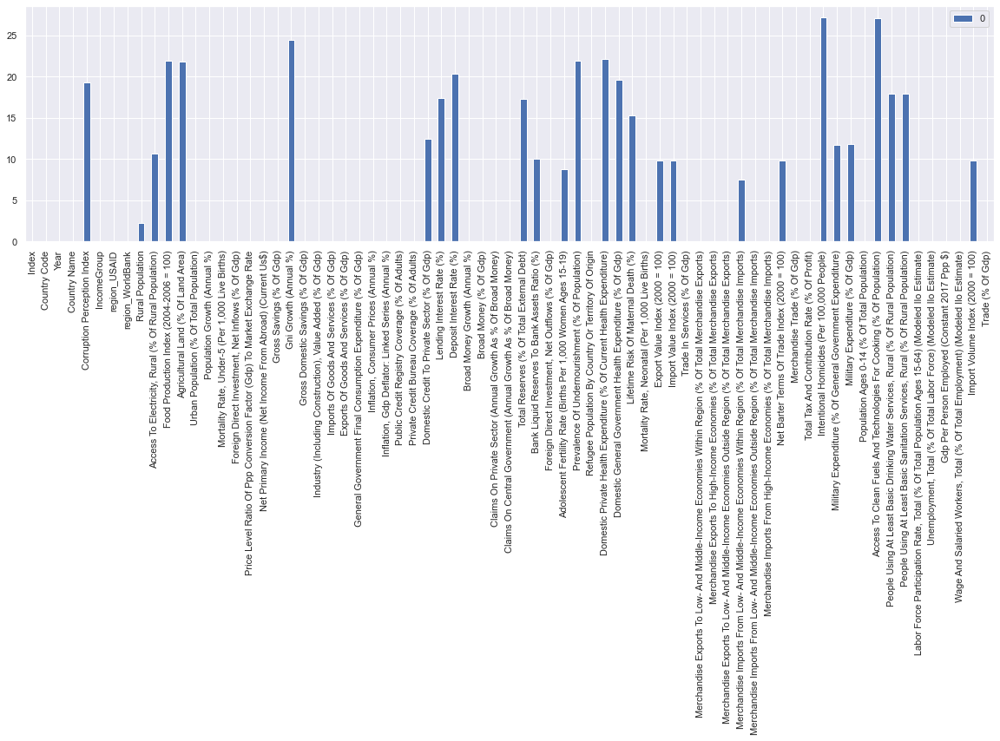

In [177]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)'].isnull(), 
       'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)

In [178]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'], axis = 1)

0.9993299930385819


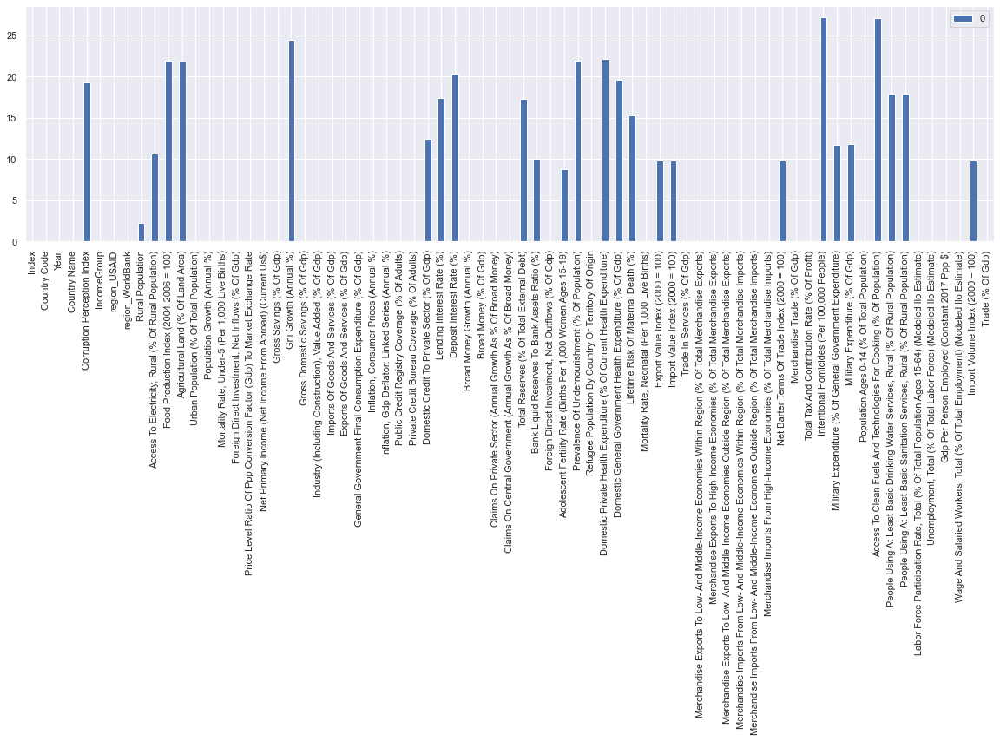

In [179]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'].isnull(), 
       'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)

In [180]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'], axis = 1)

0.9995802783505269


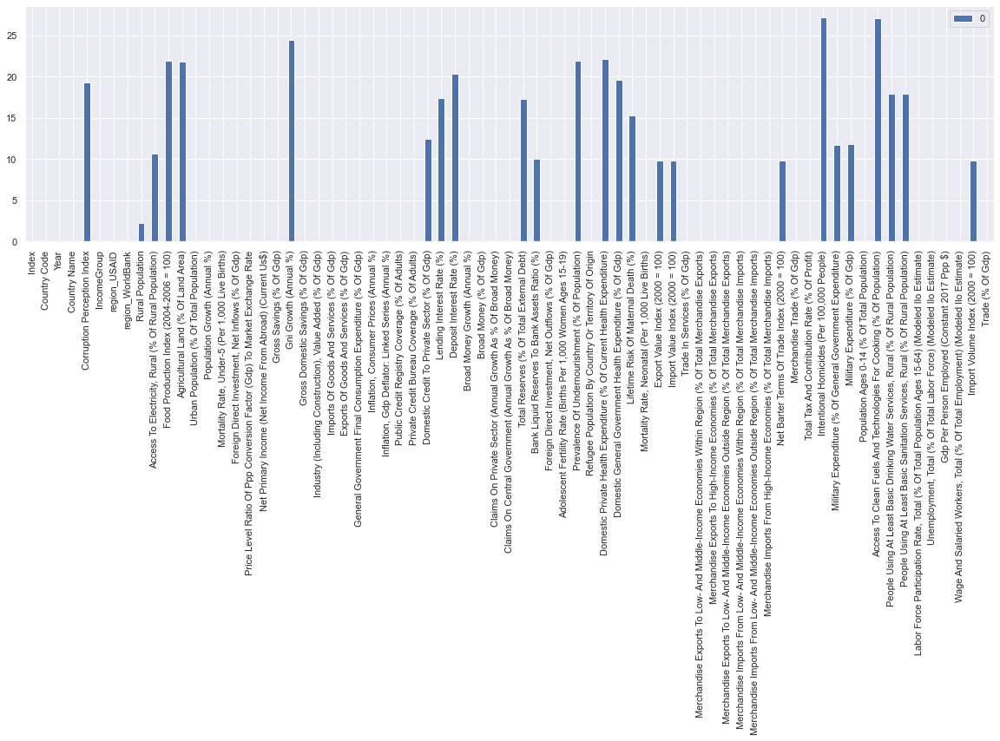

In [181]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'].isnull(), 
       'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Export Value Index (2000 = 100)

In [182]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Export Value Index (2000 = 100)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Export Value Index (2000 = 100)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Export Value Index (2000 = 100)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Export Value Index (2000 = 100)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Export Value Index (2000 = 100)'], axis = 1)

0.9984833189633017


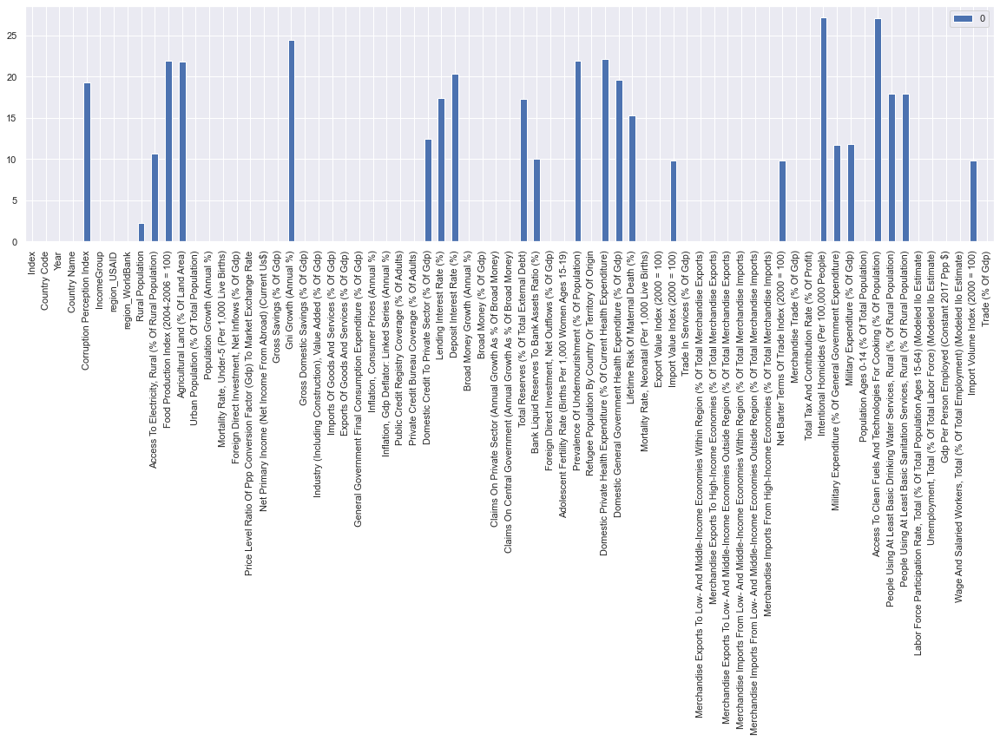

In [183]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Export Value Index (2000 = 100)'].isnull(), 
       'Export Value Index (2000 = 100)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Import Value Index (2000 = 100)

In [184]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Import Value Index (2000 = 100)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Import Value Index (2000 = 100)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Import Value Index (2000 = 100)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Import Value Index (2000 = 100)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Import Value Index (2000 = 100)'], axis = 1)

0.9978767965168801


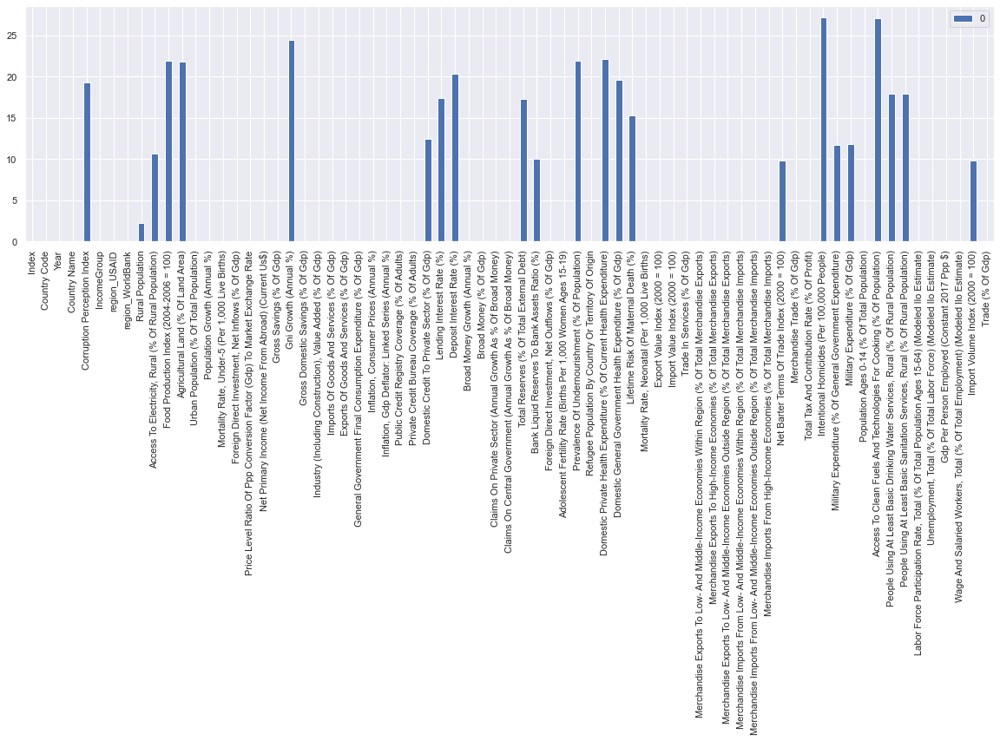

In [185]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Import Value Index (2000 = 100)'].isnull(), 
       'Import Value Index (2000 = 100)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Net Barter Terms Of Trade Index (2000 = 100)

In [186]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Net Barter Terms Of Trade Index (2000 = 100)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Net Barter Terms Of Trade Index (2000 = 100)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Net Barter Terms Of Trade Index (2000 = 100)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Net Barter Terms Of Trade Index (2000 = 100)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Net Barter Terms Of Trade Index (2000 = 100)'], axis = 1)

0.9985534596977699


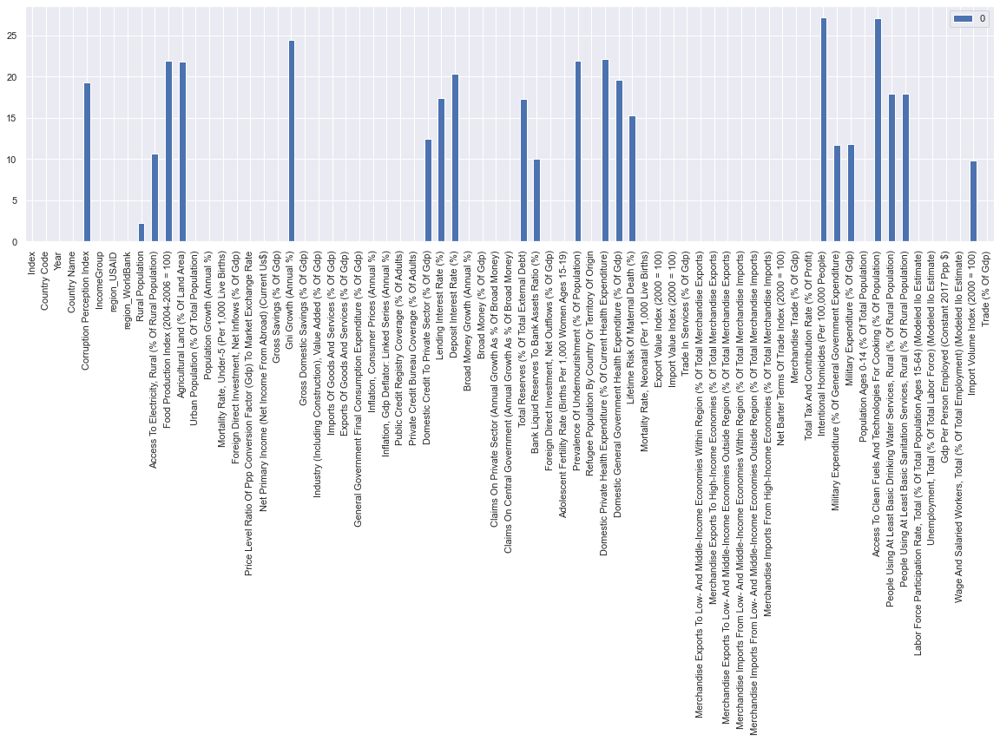

In [187]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Net Barter Terms Of Trade Index (2000 = 100)'].isnull(), 
       'Net Barter Terms Of Trade Index (2000 = 100)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Import Volume Index (2000 = 100)

In [188]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Import Volume Index (2000 = 100)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Import Volume Index (2000 = 100)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Import Volume Index (2000 = 100)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Import Volume Index (2000 = 100)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Import Volume Index (2000 = 100)'], axis = 1)

0.9989998276756646


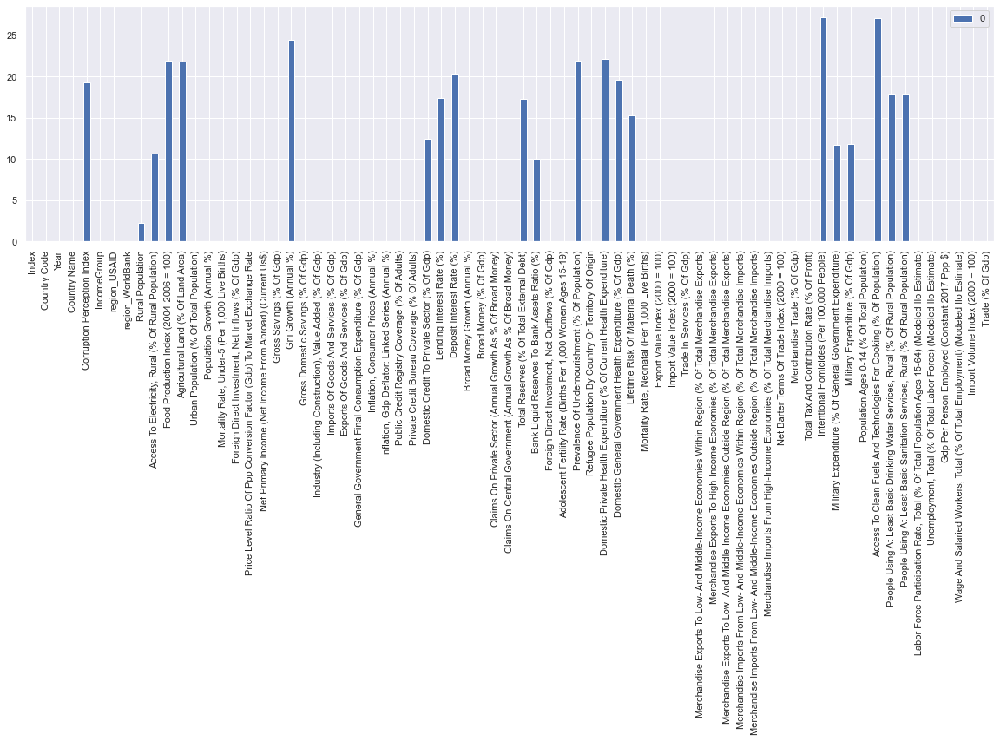

In [189]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Import Volume Index (2000 = 100)'].isnull(), 
       'Import Volume Index (2000 = 100)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Bank Liquid Reserves To Bank Assets Ratio (%)

In [193]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)','Bank Liquid Reserves To Bank Assets Ratio (%)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Bank Liquid Reserves To Bank Assets Ratio (%)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Bank Liquid Reserves To Bank Assets Ratio (%)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Bank Liquid Reserves To Bank Assets Ratio (%)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Bank Liquid Reserves To Bank Assets Ratio (%)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Bank Liquid Reserves To Bank Assets Ratio (%)'], axis = 1)

0.9995501009297607


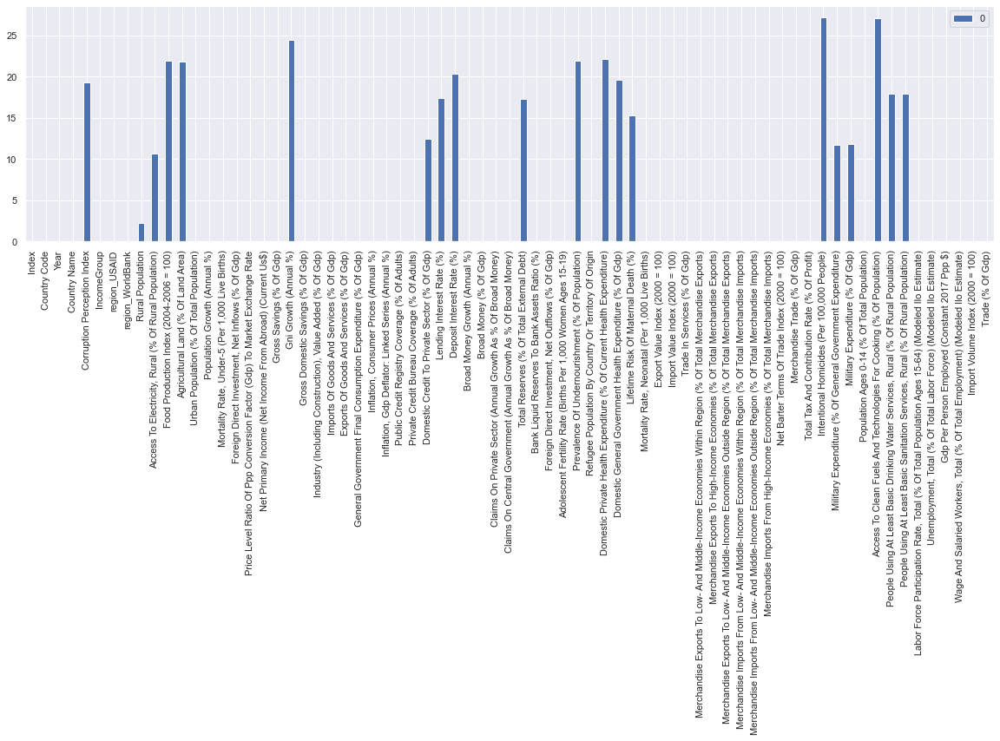

In [194]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Bank Liquid Reserves To Bank Assets Ratio (%)'].isnull(), 
       'Bank Liquid Reserves To Bank Assets Ratio (%)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Access To Electricity, Rural (% Of Rural Population)

In [195]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)','Bank Liquid Reserves To Bank Assets Ratio (%)',
                                  'Access To Electricity, Rural (% Of Rural Population)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Access To Electricity, Rural (% Of Rural Population)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Access To Electricity, Rural (% Of Rural Population)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Access To Electricity, Rural (% Of Rural Population)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Access To Electricity, Rural (% Of Rural Population)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Access To Electricity, Rural (% Of Rural Population)'], axis = 1)

0.9990919045370836


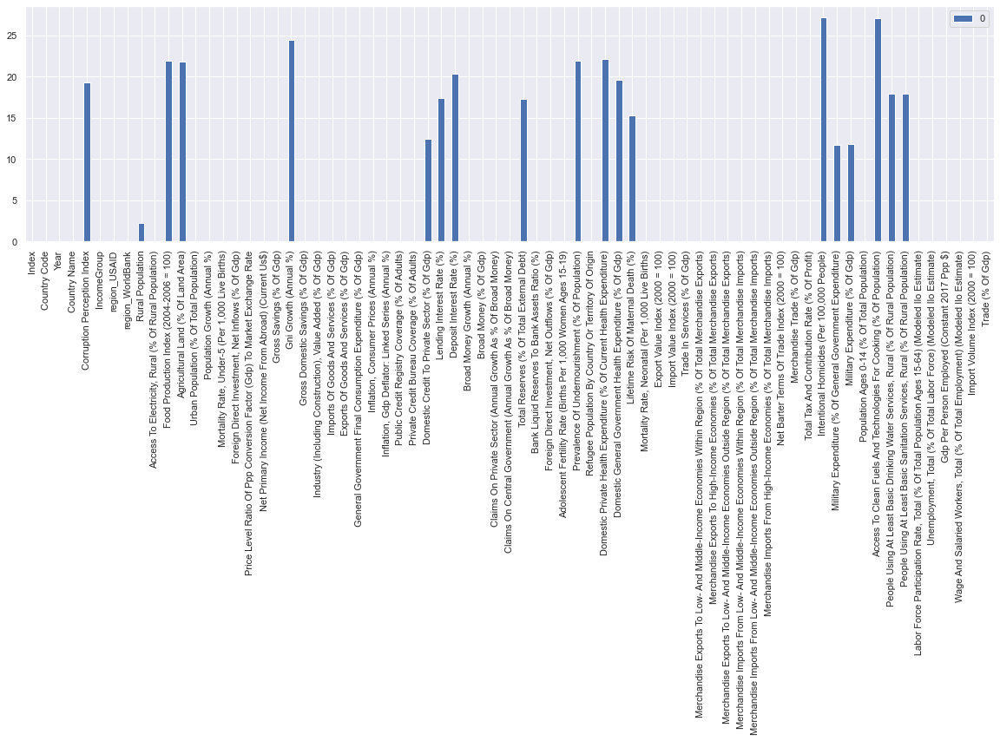

In [196]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Access To Electricity, Rural (% Of Rural Population)'].isnull(), 
       'Access To Electricity, Rural (% Of Rural Population)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Military Expenditure (% Of General Government Expenditure)

In [197]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)','Bank Liquid Reserves To Bank Assets Ratio (%)',
                                  'Access To Electricity, Rural (% Of Rural Population)','Military Expenditure (% Of General Government Expenditure)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Military Expenditure (% Of General Government Expenditure)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Military Expenditure (% Of General Government Expenditure)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Military Expenditure (% Of General Government Expenditure)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Military Expenditure (% Of General Government Expenditure)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Military Expenditure (% Of General Government Expenditure)'], axis = 1)

0.9992651204579311


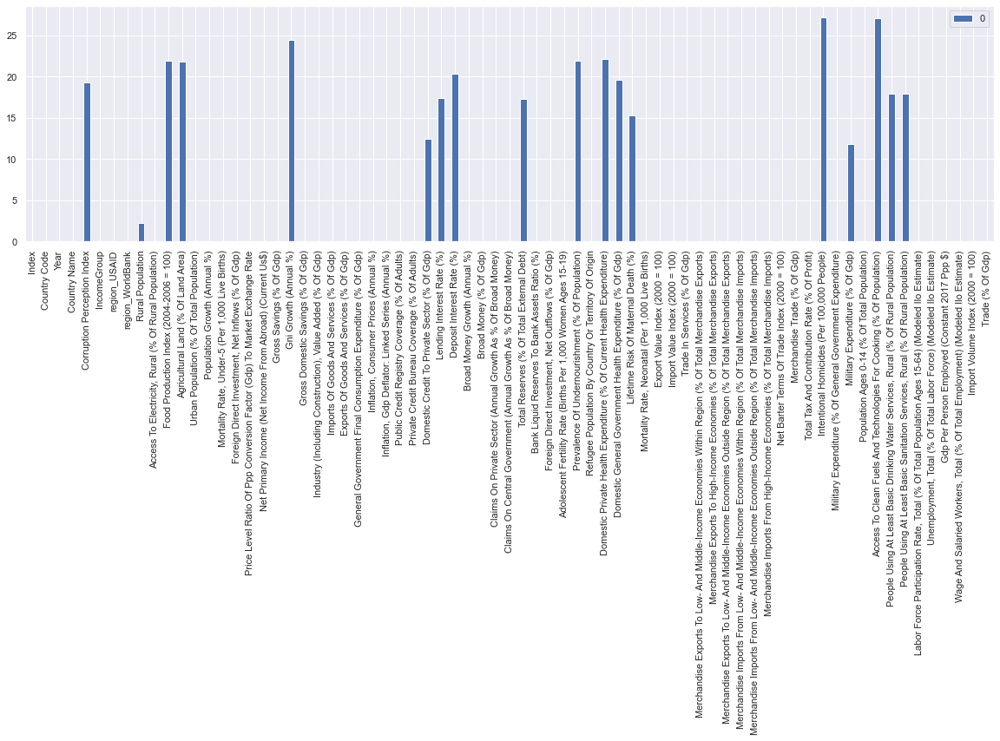

In [198]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Military Expenditure (% Of General Government Expenditure)'].isnull(), 
       'Military Expenditure (% Of General Government Expenditure)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Military Expenditure (% Of Gdp)

In [199]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)','Bank Liquid Reserves To Bank Assets Ratio (%)',
                                  'Access To Electricity, Rural (% Of Rural Population)','Military Expenditure (% Of General Government Expenditure)',
                                  'Military Expenditure (% Of Gdp)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Military Expenditure (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Military Expenditure (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Military Expenditure (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Military Expenditure (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Military Expenditure (% Of Gdp)'], axis = 1)

0.996781954324387


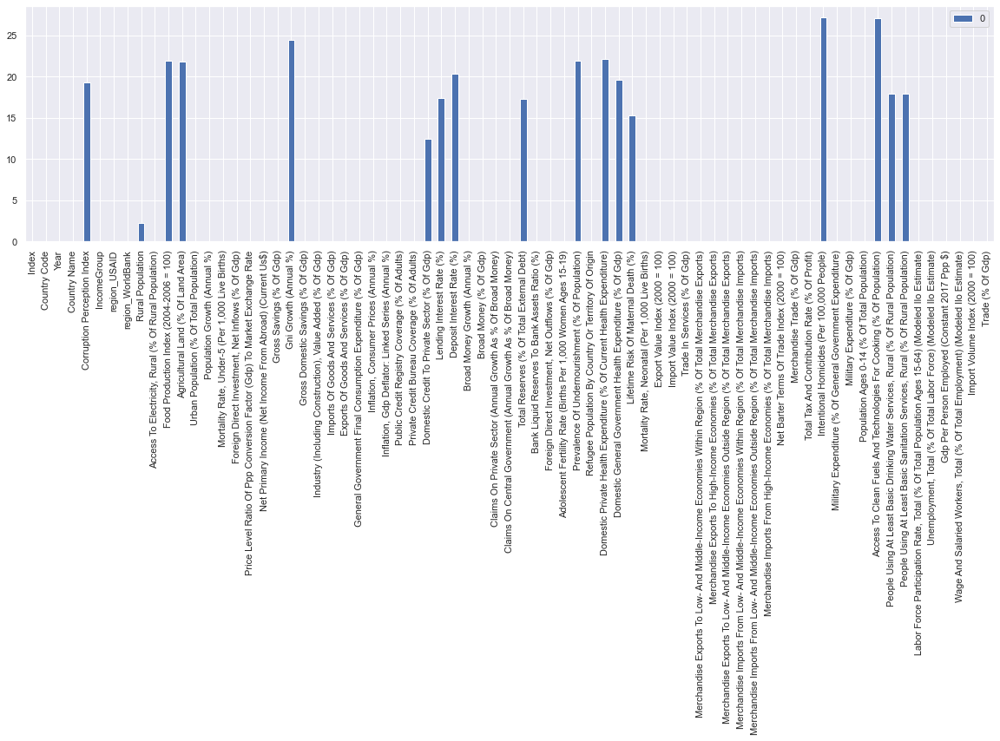

In [200]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Military Expenditure (% Of Gdp)'].isnull(), 
       'Military Expenditure (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Domestic Credit To Private Sector (% Of Gdp)

In [201]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)','Bank Liquid Reserves To Bank Assets Ratio (%)',
                                  'Access To Electricity, Rural (% Of Rural Population)','Military Expenditure (% Of General Government Expenditure)',
                                  'Military Expenditure (% Of Gdp)','Domestic Credit To Private Sector (% Of Gdp)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Domestic Credit To Private Sector (% Of Gdp)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Domestic Credit To Private Sector (% Of Gdp)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Domestic Credit To Private Sector (% Of Gdp)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Domestic Credit To Private Sector (% Of Gdp)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Domestic Credit To Private Sector (% Of Gdp)'], axis = 1)

0.999466059035053


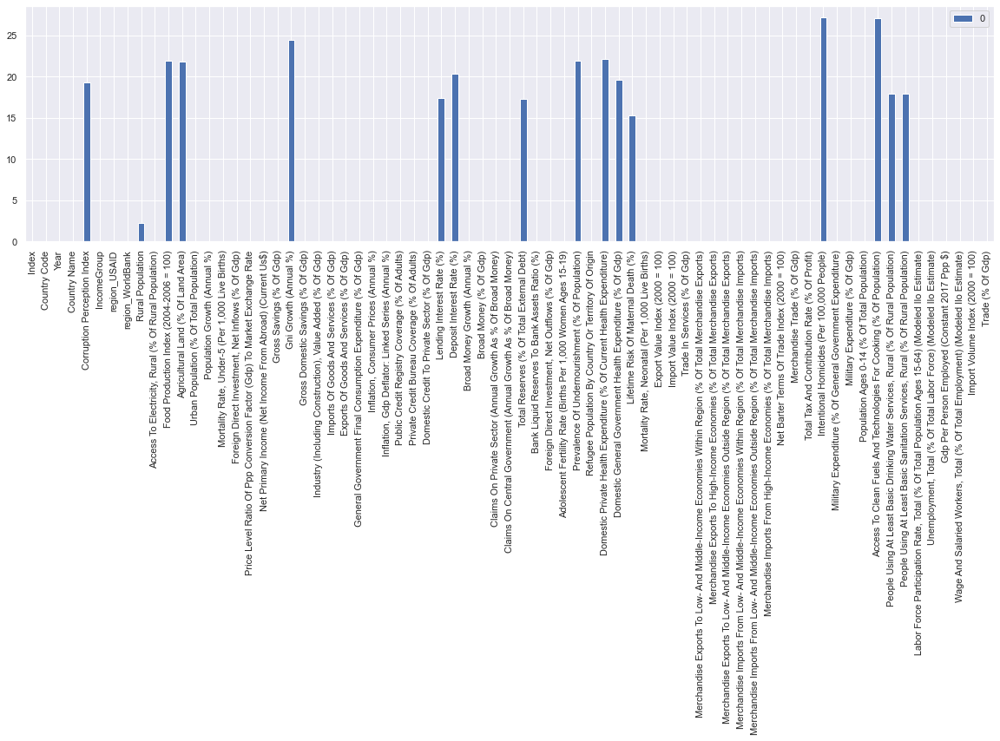

In [202]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Domestic Credit To Private Sector (% Of Gdp)'].isnull(), 
       'Domestic Credit To Private Sector (% Of Gdp)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

## Lifetime Risk Of Maternal Death (%)

In [204]:
sample_impute = pd.get_dummies(df[['Index', 'Country Name','Year'
    ,'IncomeGroup', 'region_USAID',
       'region_WorldBank',
    'Population Growth (Annual %)',
    'Inflation, Gdp Deflator: Linked Series (Annual %)',
                                   'Price Level Ratio Of Ppp Conversion Factor (Gdp) To Market Exchange Rate',
                                   'Gross Domestic Savings (% Of Gdp)',
                                   'General Government Final Consumption Expenditure (% Of Gdp)'
                                  ,'Urban Population (% Of Total Population)','Mortality Rate, Under-5 (Per 1,000 Live Births)','Mortality Rate, Neonatal (Per 1,000 Live Births)',
                                  'Population Ages 0-14 (% Of Total Population)','Labor Force Participation Rate, Total (% Of Total Population Ages 15-64) (Modeled Ilo Estimate)',
                                  'Unemployment, Total (% Of Total Labor Force) (Modeled Ilo Estimate)','Wage And Salaried Workers, Total (% Of Total Employment) (Modeled Ilo Estimate)',
                                  'Refugee Population By Country Or Territory Of Origin','Inflation, Consumer Prices (Annual %)','Gdp Per Person Employed (Constant 2017 Ppp $)',
                                  'Industry (Including Construction), Value Added (% Of Gdp)','Broad Money (% Of Gdp)','Imports Of Goods And Services (% Of Gdp)',
                                  'Exports Of Goods And Services (% Of Gdp)','Trade (% Of Gdp)',
                                  'Claims On Central Government (Annual Growth As % Of Broad Money)',
                                  'Claims On Private Sector (Annual Growth As % Of Broad Money)',
                                  'Broad Money Growth (Annual %)', 'Trade In Services (% Of Gdp)',
                                  'Net Primary Income (Net Income From Abroad) (Current Us$)',
                                  'Merchandise Trade (% Of Gdp)','Gross Savings (% Of Gdp)',
                                  'Foreign Direct Investment, Net Outflows (% Of Gdp)',
                                  'Merchandise Exports To High-Income Economies (% Of Total Merchandise Exports)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Outside Region (% Of Total Merchandise Imports)',
                                  'Merchandise Imports From High-Income Economies (% Of Total Merchandise Imports)',
                                  'Public Credit Registry Coverage (% Of Adults)',
                                  'Private Credit Bureau Coverage (% Of Adults)','Total Tax And Contribution Rate (% Of Profit)',
                                  'Merchandise Exports To Low- And Middle-Income Economies Within Region (% Of Total Merchandise Exports)',
                                  'Merchandise Imports From Low- And Middle-Income Economies Within Region (% Of Total Merchandise Imports)',
                                  'Adolescent Fertility Rate (Births Per 1,000 Women Ages 15-19)','Export Value Index (2000 = 100)',
                                  'Import Value Index (2000 = 100)','Net Barter Terms Of Trade Index (2000 = 100)',
                                  'Import Volume Index (2000 = 100)','Bank Liquid Reserves To Bank Assets Ratio (%)',
                                  'Access To Electricity, Rural (% Of Rural Population)','Military Expenditure (% Of General Government Expenditure)',
                                  'Military Expenditure (% Of Gdp)','Domestic Credit To Private Sector (% Of Gdp)','Lifetime Risk Of Maternal Death (%)'
                                  ]])

# Split the data into two datasets
#train
sample_imputeKnown = sample_impute[sample_impute['Lifetime Risk Of Maternal Death (%)'].notnull()] # without NaN

#test
sample_imputeUnknown = sample_impute[sample_impute['Lifetime Risk Of Maternal Death (%)'].isnull()] #with null values


# splitting the train set into X and y
sample_imputeKnown_X = sample_imputeKnown.drop(['Lifetime Risk Of Maternal Death (%)'], axis = 1)
sample_imputeKnown_y = sample_imputeKnown['Lifetime Risk Of Maternal Death (%)']

#preparing the test set
sample_imputeUnknown_X = sample_imputeUnknown.drop(['Lifetime Risk Of Maternal Death (%)'], axis = 1)

0.9998127858635598


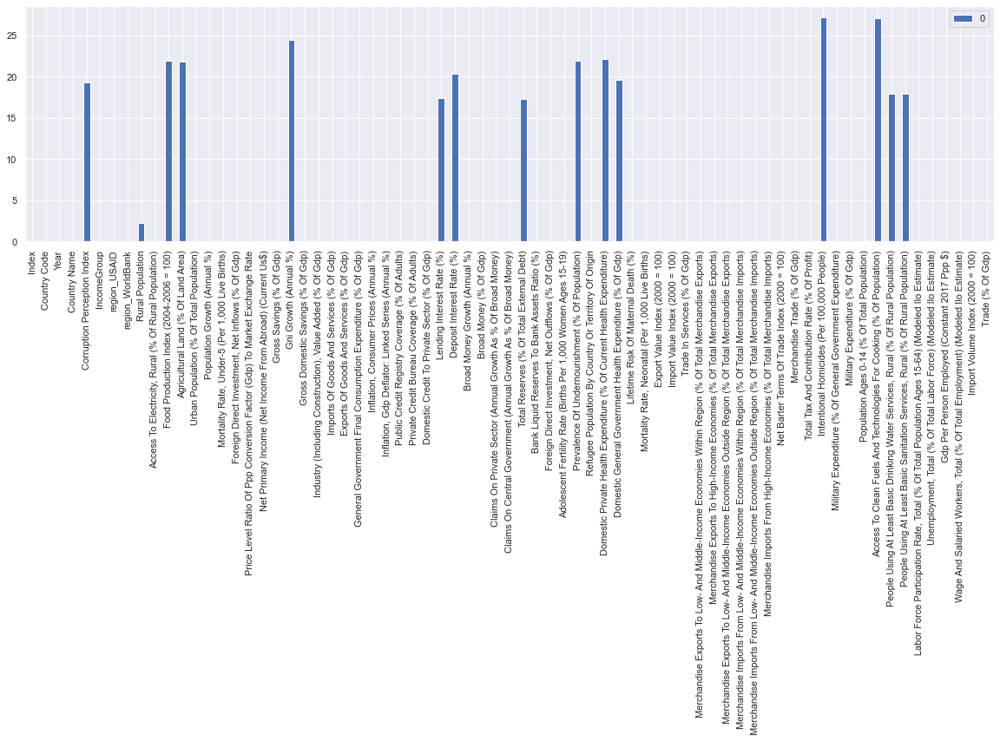

In [205]:
# Build model using random forest
from sklearn.ensemble import RandomForestRegressor

rfr=RandomForestRegressor(random_state=1,n_estimators=500,n_jobs=-1)

rfr.fit(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y)

print(rfr.score(sample_imputeKnown_X.iloc[:,1:], sample_imputeKnown_y))

#prediction
sample_imputeUnknown_y = rfr.predict(sample_imputeUnknown_X.iloc[:,1:])

df.loc[df['Lifetime Risk Of Maternal Death (%)'].isnull(), 
       'Lifetime Risk Of Maternal Death (%)'] = sample_imputeUnknown_y

pd.DataFrame(df.isna().sum()*100/df.shape[0]).plot.bar(figsize=(20,5))

In [212]:
#imputed_yue = df
#imputed_yue.to_csv('imputed_yue.csv')

In [213]:
df = pd.read_csv('imputed_yue.csv')